# Example of an End-to-end Machine Learning Project

Some key notions:

1. We need to split the data into training and testing sets
2. We should do some visualization and exploratory data analysis first
3. We need to clean the data, deal with missing data, convert categorical variables, and engineer features (aka inputs, predictors) to be similar in scale, ideally somewhat Gaussian
4. We need to select and train appropriate candidate models
5. We want to avoid *under*fitting the data: That is, we want our model to capture the underlying relationships between input and output
6. We want to avoid *over*fitting as well: Don't chase the noise, i.e. train our model on the random particulars of the dataset
7. Use the training/validation/test paradigm for model selection and hyperparameter training

**Based on Chapter 2 of Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow**

## Overall Process:

#### Part 1: Get the Data, Explore
1. Define our Problem/Question
2. Get the Data
3. Test/Train Split
    - Statified vs. Purely random
4. Visualize/Explore the Data
    - Distributions
    - Scatter plots
    - Correlations
    - Geospatial if relevant
    
#### Part 2: Get Ready for Machine Learning

5. Prep/Clean the Data Further: Get ready for ML:
    - Deal with missing data
    - Convert categorical
    - Feature scaling
    - Feature transformations
    - Transformation pipelines (optional)

#### Part 3: Train + Tune the Models

6. Train candidate models
    - Decide on some models
    - Choose metrics for assessment
    - Tune hyperparameters using validation set or cross-validation


#### Part 4: Test

7. Moment of truth: Testing data


# Part 1: Get the Data and Basic Exploration

## Data?

- Housing data for each US Census Block group in California
- Question: Can we predict median housing price for a district, given other characteristics
- This is a supervised learning task
- = "Regression," since we are predicting a continuous output
- = "Multiple regression" since we plan on using multiple predictors

### Can access book Colab code at:
https://homl.info/colab3

In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

In [1]:
#Let's download the data locally:
#######

#from urllib import request
#import tarfile

#URL for file
#url_name = "https://github.com/ageron/data/raw/main/housing.tgz"

#Local file name to save to
#local_file = 'Data/housing.tgz'

#Download and save
#request.urlretrieve(url_name, local_file)

In [ ]:
## And extract the tarball:
#with tarfile.open(local_file) as housing_tarball:
#    housing_tarball.extractall(path="Data")

In [3]:
#And read with pandas
#Github:
#housing = pd.read_csv("Data/housing/housing.csv")
housing = pd.read_csv('https://raw.githubusercontent.com/seikenberry1/ML_Course/main/Lectures/Data/housing/housing.csv')

In [4]:
#First few entries:
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [5]:
#And some summary:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [6]:
#Let's examine ocean_proximity:
housing.ocean_proximity.unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [7]:
#Or, even better:
housing.ocean_proximity.value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [8]:
#And describe:
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


<ipython-input-9-3f7cdad6368f>:5: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  housing.hist(bins=50, ax=ax1)


array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'housing_median_age'}>],
       [<Axes: title={'center': 'total_rooms'}>,
        <Axes: title={'center': 'total_bedrooms'}>,
        <Axes: title={'center': 'population'}>],
       [<Axes: title={'center': 'households'}>,
        <Axes: title={'center': 'median_income'}>,
        <Axes: title={'center': 'median_house_value'}>]], dtype=object)

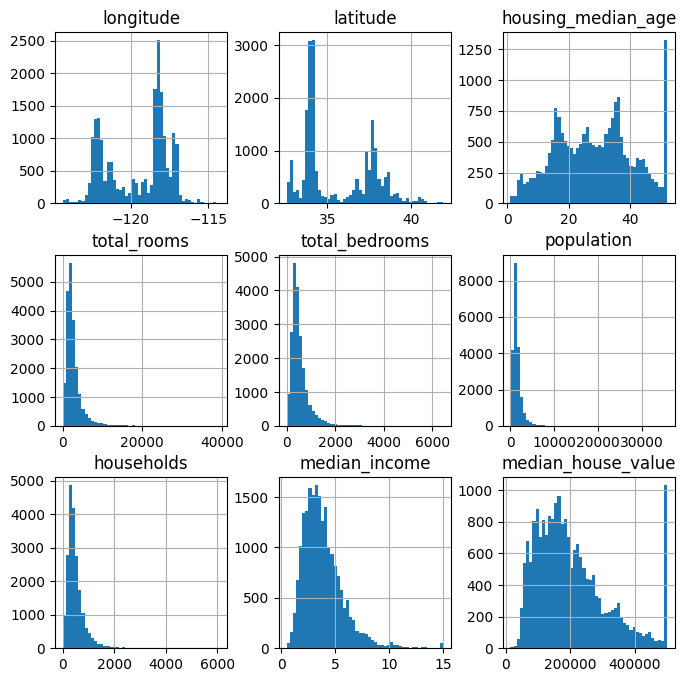

In [9]:
## Histograms:

fig, ax1 = plt.subplots(1,1, figsize=(8, 8))

housing.hist(bins=50, ax=ax1)

In [10]:
## Note that several are cleary capped:
#Ex median_house_value
print(housing.median_house_value.max())
print(np.sum(housing.median_house_value == housing.median_house_value.max()))

500001.0
965


In [11]:
#Income:
print(housing.median_income.max())
print(np.sum(housing.median_income == housing.median_income.max()))

15.0001
49


In [12]:
#Median Housing Age:
print(housing.housing_median_age.max())
print(np.sum(housing.housing_median_age == housing.housing_median_age.max()))

52.0
1273


#### And many of our distribution are right-skew...

### First: Train/Test Split

- We'll do a simple test/train split (no validation set)
- And use cross-validation for hyperparameter tuning

Once we've done the train/test split, no peaking at the test set until the very end!

In [13]:
## A couple ways to get a train/test split:
## Assuming getting a DataFrame in:

def tt_split1(df, test_fraction, seed = 42):
    #Set the seed so we always get the same split, for a given dataset
    np.random.seed(seed)

    # Randomize the DataFrame via a sample: (i.e. shuffle the rows):
    df_randomized = df.sample(frac=1)  #could also set seed by argument random_state=seed

    # Calculate index for split (size of train data) -take first (1 - test_fraction) of the data for training set
    N = round(len(df_randomized) * (1 - test_fraction))

    # Split into training and test dataframes
    # We can throw in reseting the index as well; drop=True means don't keep the old index as a column
    training_df = df_randomized[:N].reset_index(drop=True)

    test_df = df_randomized[N:].reset_index(drop=True)

    # Return both (actually a tuple of both):
    return training_df, test_df

In [14]:
#We'll use the following two for index shuffing:
#Note both methods give the same result for a given seed
seed = 2
np.random.seed(seed)
print(np.random.choice(10, 10, replace=False))

np.random.seed(seed)
print(np.random.permutation(10))

[4 1 5 0 7 2 3 6 9 8]
[4 1 5 0 7 2 3 6 9 8]


In [15]:
## A second way where we permute the indices
## Assuming getting a DataFrame in:

def tt_split2(df, test_fraction, seed = 42):
    #Set the seed so we always get the same split, for a given dataset
    np.random.seed(seed)

    # Get shuffled indices:
    shuffled_indices = np.random.choice(len(df), len(df), replace=False)

    #Could also use:
    #shuffled_indices = np.random.permutation(len(df))

    # Calculate index for split (size of train data) -take first (1 - test_fraction) of the data for training set
    N = round(len(df) * (1 - test_fraction))

    # Split into training and test dataframes
    # We can throw in reseting the index as well; drop=True means don't keep the old index as a column
    training_df = df.iloc[:N].reset_index(drop=True)

    test_df = df.iloc[N:].reset_index(drop=True)

    # Return both
    return training_df, test_df

In [16]:
#Try it out:
train_df, test_df = tt_split2(housing, .2, 42)
train_df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [17]:
train_df.shape

(16512, 10)

In [18]:
test_df.shape

(4128, 10)

#### What if we may add to dataset in future?

Can do the following (will often give a split that is not exactly 20%, etc. to test, but very close)

- Give each observation/row a unique identifier, and hash it
- Put each observation with a hash less than 20% (or whatever) of the max hash value, $2^{32}$ here

In [19]:
from zlib import crc32

In [20]:
#Adopted from our book:
def is_id_in_test_set(identifier, test_fraction):
    return crc32(np.int64(identifier)) < test_fraction * 2**32

In [21]:
def split_data_with_id_hash(df, test_fraction, id_column):
    #ID for the observations:
    ids = df[id_column]

    #Get a boolean: Either is or isn't in test set:
    in_test_set = ids.apply(lambda x: is_id_in_test_set(x, test_fraction))

    #Filter our test/training:
    training_df = df.loc[~in_test_set]
    test_df = df.loc[in_test_set]

    return training_df, test_df

In [22]:
#Reset index to get it as an identifier

housing2 = housing.reset_index()
housing2

,index,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...,...
20635,20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [23]:
#Let's see if this worked:
#First, split first 50 entries

train_df, test_df = split_data_with_id_hash(housing2.iloc[:50], .2, 'index')

#What were our lengths?
print(len(train_df))
print(len(test_df))

#Get all the indices in the test/train sets:
train_index_set1 = train_df.index.values
test_index_set1 = test_df.index.values
test_index_set1

38
12


array([ 2,  5, 12, 16, 23, 25, 30, 35, 36, 42, 45, 49])

In [24]:
#Now, suppose we added to the dataset and now have 200 entries:
train_df, test_df = split_data_with_id_hash(housing2.iloc[:200], .2, 'index')

#What were our lengths?
print(len(train_df))
print(len(test_df))

#Get all the indices in the new test/train sets:
train_index_set2 = train_df.index.values
test_index_set2 = test_df.index.values
test_index_set2

158
42


array([  2,   5,  12,  16,  23,  25,  30,  35,  36,  42,  45,  49,  54,
        56,  66,  69,  75,  76,  80,  89,  94, 100, 106, 109, 113, 118,
       120, 127, 137, 142, 146, 149, 155, 156, 161, 166, 168, 175, 186,
       189, 192, 199])

In [25]:
#Was everything in initial test set in the second?
[i in test_index_set2 for i in test_index_set1]

[True, True, True, True, True, True, True, True, True, True, True, True]

In [26]:
#Same for training? Just sum:
np.sum([i in train_index_set2 for i in train_index_set1])

38

### The Easy Way: Just use scikit-learn

In [27]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(housing, test_size=.2, random_state=42)
train_df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
14196,-117.22,32.75,34.0,6001.0,1111.0,2654.0,1072.0,4.5878,291000.0,NEAR OCEAN
8267,-117.03,32.69,10.0,901.0,163.0,698.0,167.0,4.6648,156100.0,NEAR OCEAN
17445,-122.27,37.74,28.0,6909.0,1554.0,2974.0,1484.0,3.6875,353900.0,NEAR BAY
14265,-121.82,37.25,25.0,4021.0,634.0,2178.0,650.0,5.1663,241200.0,<1H OCEAN
2271,-115.98,33.32,8.0,240.0,46.0,63.0,24.0,1.4688,53800.0,INLAND
...,...,...,...,...,...,...,...,...,...,...
11284,-122.37,37.94,49.0,969.0,229.0,599.0,195.0,1.3167,71600.0,NEAR BAY
11964,-118.38,33.89,35.0,1778.0,330.0,732.0,312.0,6.5745,379300.0,<1H OCEAN
5390,-119.33,36.28,16.0,2624.0,527.0,1077.0,520.0,2.1250,104200.0,INLAND
860,-117.19,34.08,22.0,2467.0,555.0,1567.0,494.0,2.6536,84700.0,INLAND


In [28]:
##Suppose we are predicting median_house_value, which we are, and we do the following:
####

X = housing[housing.columns.difference(['median_house_value'])]
y = housing['median_house_value']

In [29]:
## Could now do the test/train split like so:
######

train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=.2, random_state=42)
train_y


14196    291000.0
8267     156100.0
17445    353900.0
14265    241200.0
2271      53800.0
           ...   
11284     71600.0
11964    379300.0
5390     104200.0
860       84700.0
15795    251400.0
Name: median_house_value, Length: 16512, dtype: float64

### Stratified Sampling in scikit-learn

- Want to have balanced datasets, e.g. gender, income, etc.
- That is, both train and test sets should be representative of data overall wrt such categories
- Divide population into strata = homogenous subgroups

Let's categorize income into 5 categories using `pd.cut`:

In [30]:
housing['income_cat'] = pd.cut(housing['median_income'],
                               bins = [0, 1.5, 3, 4.5, 6, np.inf],
                               labels = [1, 2, 3, 4, 5])

In [31]:
#How does the data partition?
housing['income_cat'].value_counts().sort_index()

1     822
2    6581
3    7236
4    3639
5    2362
Name: income_cat, dtype: int64

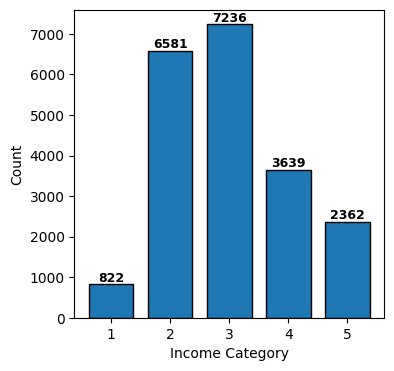

In [32]:
#Bar plot:
fig, ax1 = plt.subplots(1,1, figsize=(4, 4))

housing['income_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1, edgecolor='black', width=.75)
ax1.set_xlabel('Income Category')
ax1.set_ylabel('Count')

#Add the counts:
#Note the data is in container.datavalues
for container in ax1.containers:
    ax1.bar_label(container, fontweight='bold', fontsize=9)


In [33]:
##Get stratified split:
#Easy way:

train_df, test_df = train_test_split(housing, test_size=.2, random_state=42, stratify = housing['income_cat'])


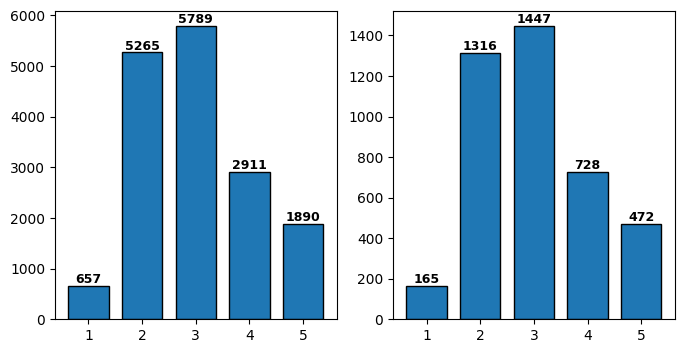

In [34]:
#And compare the balance:
####

fig, ax1 = plt.subplots(1,2, figsize=(8, 4))

train_df['income_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1[0], edgecolor='black', width=.75)
test_df['income_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1[1], edgecolor='black', width=.75)

#Adding counts:
for i in range(2):
    for container in ax1[i].containers:
        ax1[i].bar_label(container, fontweight='bold', fontsize=9)

In [35]:
(train_df['income_cat'].value_counts().sort_index() / len(train_df))

1    0.039789
2    0.318859
3    0.350594
4    0.176296
5    0.114462
Name: income_cat, dtype: float64

In [36]:
(test_df['income_cat'].value_counts().sort_index() / len(test_df))

1    0.039971
2    0.318798
3    0.350533
4    0.176357
5    0.114341
Name: income_cat, dtype: float64

### Compare stratified vs. purely random:

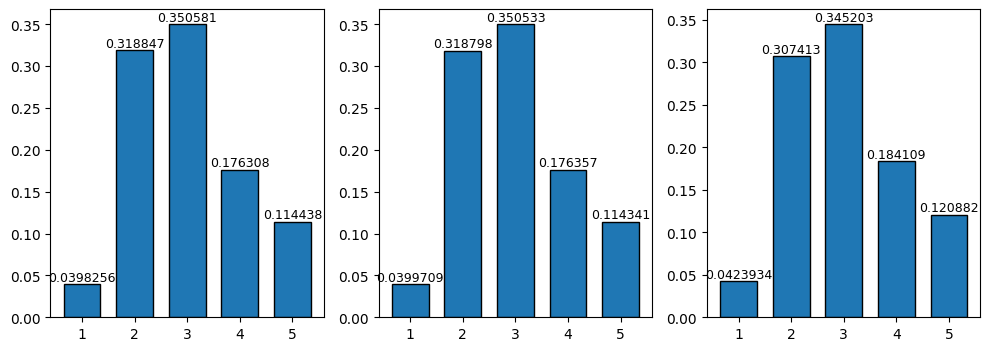

In [37]:
#Let's compare the overall dataset and the two versions of the test set:
#####

train_df1, test_df1 = train_test_split(housing, test_size=.2, random_state=42, stratify = housing['income_cat'])
train_df2, test_df2 = train_test_split(housing, test_size=.2, random_state=42)

#And compare overall dataset and the two test sets:
####

fig, ax1 = plt.subplots(1,3, figsize=(12, 4))

(housing['income_cat'].value_counts().sort_index() / len(housing)).plot(kind='bar', rot=0, ax=ax1[0], edgecolor='black', width=.7)
(test_df1['income_cat'].value_counts().sort_index() / len(test_df1)).plot(kind='bar', rot=0, ax=ax1[1], edgecolor='black', width=.7)
(test_df2['income_cat'].value_counts().sort_index() / len(test_df1)).plot(kind='bar', rot=0, ax=ax1[2], edgecolor='black', width=.7)


#Add the numbers to the top of the bars
for i in range(3):
    for container in ax1[i].containers:
        ax1[i].bar_label(container, fontweight='normal', fontsize=9)


#### And using `StratifiedShuffleSplit`

- Can get multiple stratified splits of the data: Useful for cross-validation

In [38]:
from sklearn.model_selection import StratifiedShuffleSplit

splitter  = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)

#This yields a *generator*:
splitter.split(housing, housing['income_cat'])

<generator object BaseShuffleSplit.split at 0x7f70fe832c70>

In [39]:
#Iterate through our generator:
#Adapted from https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedShuffleSplit.html#sklearn.model_selection.StratifiedShuffleSplit
######

train_indices = []
test_indices = []

for i, (train_index, test_index) in enumerate(splitter.split(housing, housing['income_cat'])):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}, size={len(train_index)}")
    print(f"  Test:  index={test_index}, size={len(test_index)}")

    #Since generators are lazy, we need to save these index lists for later use:
    train_indices.append(train_index)
    test_indices.append(test_index)


Fold 0:
  Train: index=[13096 14973  3785 ... 19301 19121 19888], size=16512
  Test:  index=[ 3905 16821  2900 ... 16634  9779  3455], size=4128
Fold 1:
  Train: index=[12898  9367 19304 ...  9356  7535  3261], size=16512
  Test:  index=[11734  3016 19907 ...  5264  9811   993], size=4128
Fold 2:
  Train: index=[ 1108 13041 14023 ... 14230  3997 15875], size=16512
  Test:  index=[15389  7193 13314 ... 10546 11151 10640], size=4128
Fold 3:
  Train: index=[20581  1857  9942 ...  1532  1406  3859], size=16512
  Test:  index=[14190  9837 17881 ... 14140 16175  1598], size=4128
Fold 4:
  Train: index=[ 9346 12457 16765 ...  9305 20087  3928], size=16512
  Test:  index=[16578  3358  1369 ... 14702   495 10955], size=4128
Fold 5:
  Train: index=[15191 13992 15445 ... 18711 19772  1096], size=16512
  Test:  index=[ 2256 17567  9009 ... 20309  9003 16106], size=4128
Fold 6:
  Train: index=[ 6408 17079  9105 ...  9124 17358  3215], size=16512
  Test:  index=[ 1980 10719  7725 ... 18893 15186 105

In [40]:
# We only need one of these
#######

df_train = housing.iloc[train_indices[0]]
df_test = housing.iloc[test_indices[0]]

<Axes: >

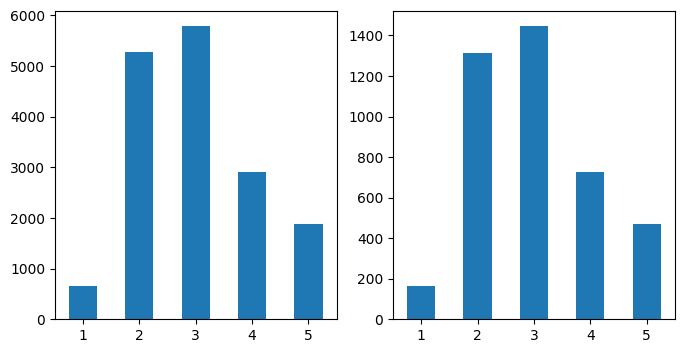

In [41]:
#And once more, check our balance:
#######

fig, ax1 = plt.subplots(1,2, figsize=(8, 4))

train_df['income_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1[0])
test_df['income_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1[1])

### Note: To stratify by two variables?

- Can concatenate two variables to a third
- Example on `housing_median_age`:

<Axes: >

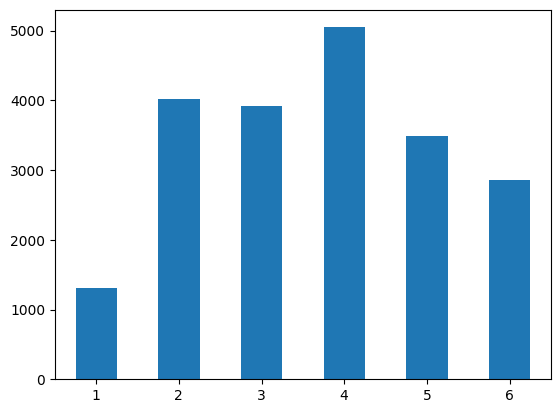

In [42]:
housing['age_cat'] = pd.cut(housing['housing_median_age'],
                               bins = 6,
                               labels = [1, 2, 3, 4, 5, 6])
#Quick check:
housing['age_cat'].value_counts().sort_index().plot(kind='bar', rot=0)

In [43]:
##Make a new column that concatenates income and housing age:
#####

housing['age_income_cat'] = housing['age_cat'].astype(str) + housing['income_cat'].astype(str)
housing['age_income_cat'].value_counts()

43    1872
42    1646
23    1363
52    1314
32    1280
33    1237
53    1209
22    1141
63    1058
62    1017
44     876
24     817
34     733
25     579
35     526
54     508
13     497
45     478
64     355
14     350
55     263
65     262
15     254
51     189
12     183
41     175
61     169
31     147
21     121
11      21
Name: age_income_cat, dtype: int64

In [44]:
#Stratify based on this:
#####

train_df, test_df = train_test_split(housing, test_size=.2, random_state=42, stratify = housing['age_income_cat'])

<Axes: >

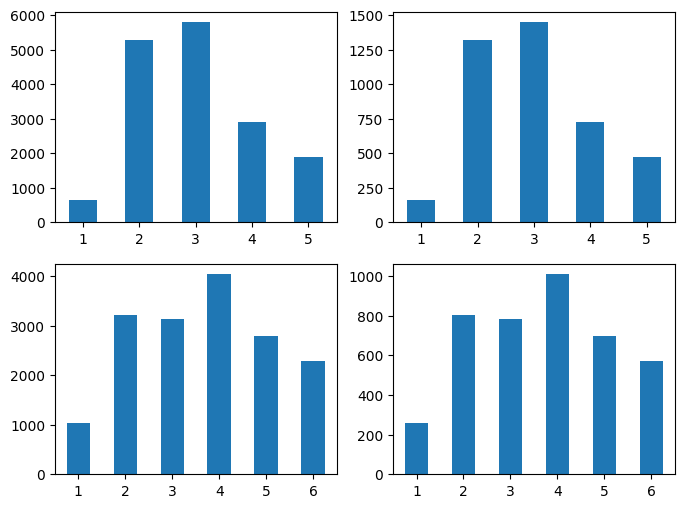

In [45]:
#And check it worked:
fig, ax1 = plt.subplots(2,2, figsize=(8, 6))

#This is super useful!
ax1 = ax1.flatten()

train_df['income_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1[0])
test_df['income_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1[1])

train_df['age_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1[2])
test_df['age_cat'].value_counts().sort_index().plot(kind='bar', rot=0, ax=ax1[3])

### Okay, Let's Decide on a Train/Test Split and Move On!

- We'll use our sets stratified by income:

- We'll make a copy of the training set so we can make changes wthout fear

In [46]:
#Just do it the easy way:
train_df, test_df = train_test_split(housing, test_size=.2, random_state=42, stratify = housing['income_cat'])

#A copy for our subsequent work:
housing_train = train_df.copy()

## Visualization, Correlations, Exploration

- Now let's take a closer look at the training data
- We'll do a little geospatial visualization
- Correlations
- Clusters

<Axes: xlabel='longitude', ylabel='latitude'>

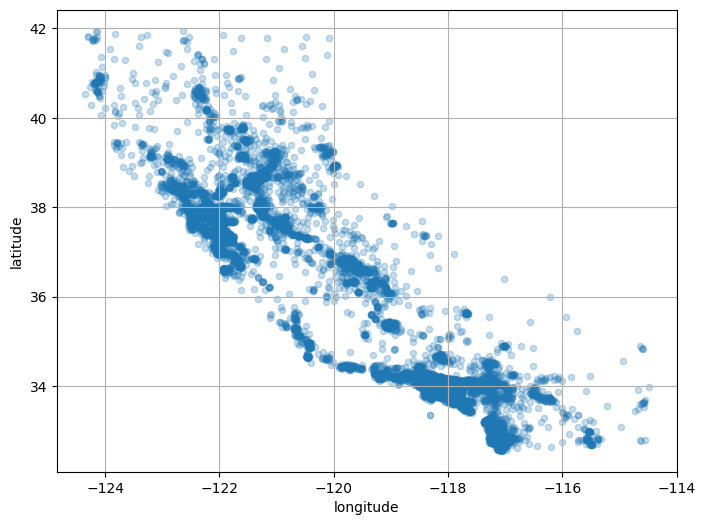

In [47]:
### Naive geospatial: see where our district centers are, plus visual density
####
fig, ax1 = plt.subplots(1,1, figsize=(8, 6))

housing_train.plot(kind='scatter', x='longitude', y='latitude', alpha=.25, grid=True, ax=ax1)

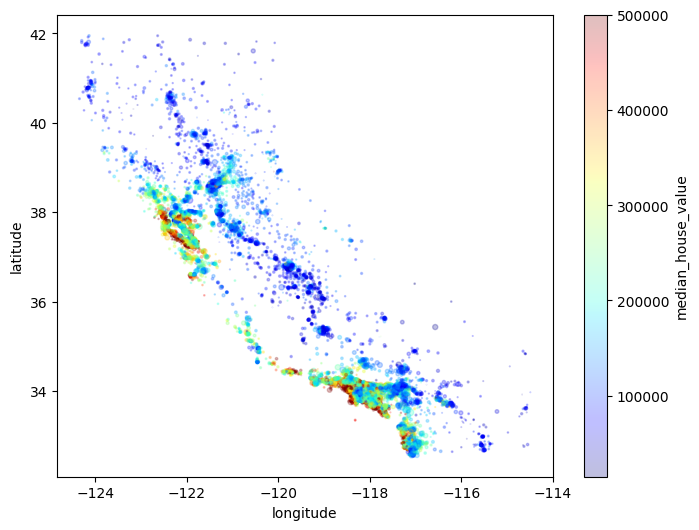

In [48]:
### Naive geospatial: Add color/size to a scatter plot:
####
fig, ax1 = plt.subplots(1,1, figsize=(8, 6))

##Note: Area scales
housing_train.plot(kind='scatter', x='longitude', y='latitude', alpha=.25, grid=False, ax=ax1,
                  s = (housing_train['population']) / 500, c = 'median_house_value', cmap='jet',
                  colorbar=True, legend=True);

## Add a Background Map?

- We will very briefly mention shapefiles and maps
- Can load as GeoDataFrame = Same as DataFrame, just with a Geometry column
- Geometry can be Point, Line, or Polygon
- Also has associated *Coordinate Reference System* (CRS) = How to go from spherical (really ellipsoidal) longitude/latitude coordinates to 2-D surface
- Simplest CRS is just a Geographic CRS: x = longitude, y = latitude

We can get US State and County Shapefiles from the US Census as follows:

In [49]:
#Get shapefile data directly from census URLs
#########

#Load state & county geometries:
#URLs:
url_state = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip'
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip'

#And grab:
state_gdf = gpd.read_file(url_state)
county_gdf = gpd.read_file(url_county)

#Also, exclude anything outside the CONUS:
#Hawaii = 15, Alasksa = 02, Puerto Rico = 72
#Guam = 66, Northern Mariana Islands = 69, American Samoa = 60, Virgin Islands = 78
exclude_list = ['15', '72', '02', '60', '66', '69', '78']

#~ is not
state_gdf = state_gdf.loc[~state_gdf['STATEFP'].isin(exclude_list)]
county_gdf = county_gdf.loc[~county_gdf['STATEFP'].isin(exclude_list)]

In [50]:
#Take a look:
###

state_gdf.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,56,01779807,0400000US56,56,WY,Wyoming,00,251458712294,1867503716,"POLYGON ((-111.05456 45.00095, -111.04507 45.0..."
2,24,01714934,0400000US24,24,MD,Maryland,00,25151992308,6979074857,"MULTIPOLYGON (((-76.05015 37.98691, -76.04998 ..."
4,05,00068085,0400000US05,05,AR,Arkansas,00,134660767709,3121950081,"POLYGON ((-94.61792 36.49941, -94.61765 36.499..."
5,38,01779797,0400000US38,38,ND,North Dakota,00,178694310772,4414779956,"POLYGON ((-104.04868 48.86378, -104.04865 48.8..."
6,10,01779781,0400000US10,10,DE,Delaware,00,5046731559,1399179670,"MULTIPOLYGON (((-75.56555 39.51485, -75.56174 ..."


<Axes: >

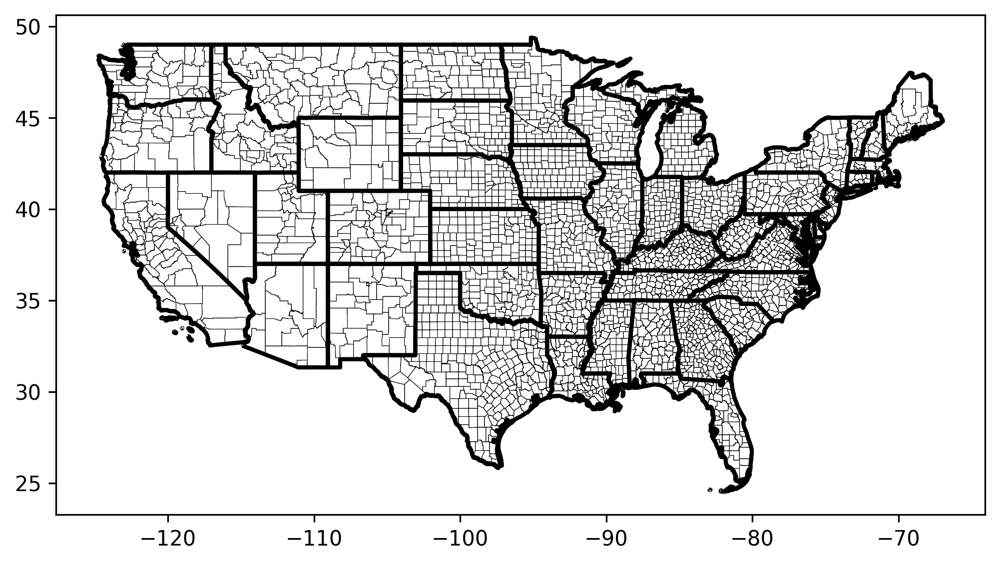

In [51]:
## Quick set of plots:
fig, ax1 = plt.subplots(1,1, figsize=(8, 8), dpi=300)

state_gdf.plot(ax=ax1, facecolor='none', linewidth=2)
county_gdf.plot(ax=ax1, facecolor='none', linewidth=.25)

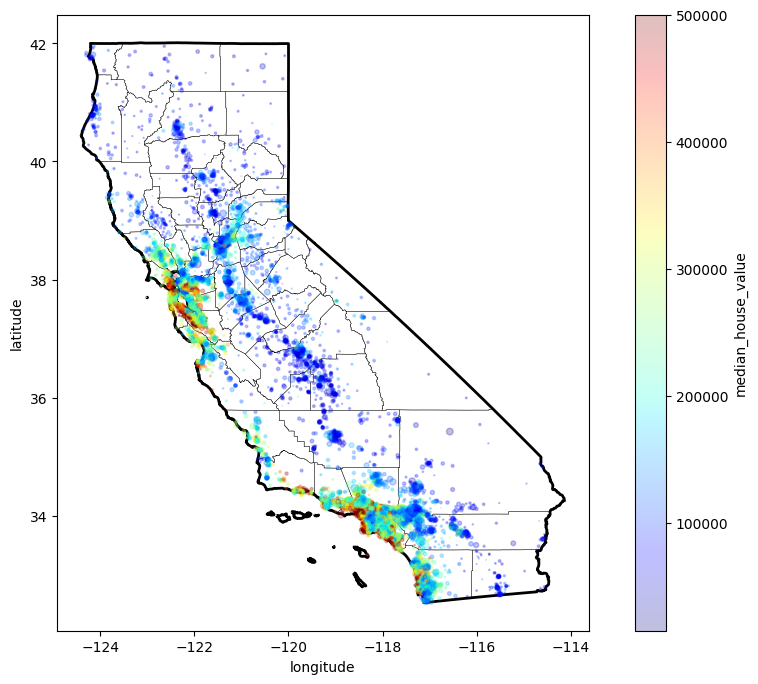

In [52]:
### Add as background to scatter plot:
#########

### Naive geospatial: Add color/size to a scatter plot:
####
fig, ax1 = plt.subplots(1,1, figsize=(12,8))

#06 is State FIPS code for California
state_gdf.loc[state_gdf.STATEFP == '06'].plot(ax=ax1, facecolor='none', linewidth=2)
county_gdf.loc[county_gdf.STATEFP == '06'].plot(ax=ax1, facecolor='none', linewidth=.25)


##Note: Area scales with s
housing_train.plot(kind='scatter', x='longitude', y='latitude', alpha=.25, grid=False, ax=ax1,
                  s = (housing_train['population']) / 300, c = 'median_house_value', cmap='jet',
                  colorbar=True, legend=True);


### Add a Basemap to vectors?
- A one-liner from `contextily` library



In [54]:
!pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 39.1 MB/s eta 0:00:00


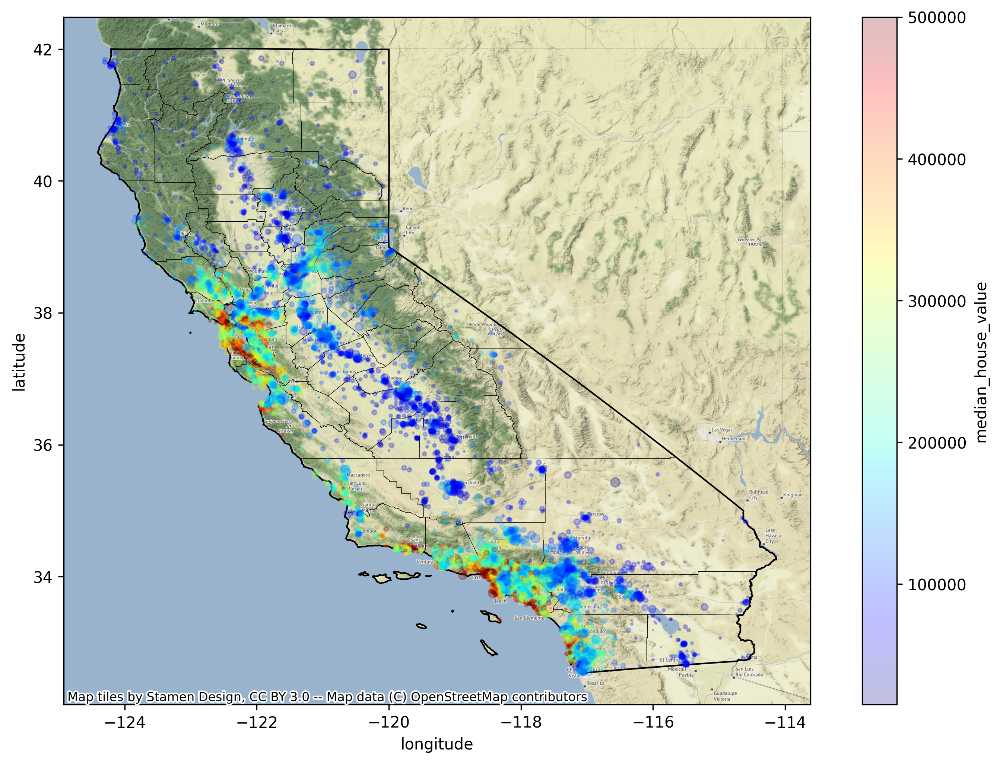

In [55]:
import contextily as cx

### Add as background to scatter plot:
#########
fig, ax1 = plt.subplots(1,1, figsize=(12,8), dpi=300)

#06 is State FIPS code for California
state_gdf.loc[state_gdf.STATEFP == '06'].plot(ax=ax1, facecolor='none', linewidth=1)
county_gdf.loc[county_gdf.STATEFP == '06'].plot(ax=ax1, facecolor='none', linewidth=.25)

#NOTE: We need to match CRS!
#If zoom level is too high, this will take forever
cx.add_basemap(ax1, crs=state_gdf.crs, zoom=8) #source=cx.providers.Stamen.TonerLite


#And our scatter plot
housing_train.plot(kind='scatter', x='longitude', y='latitude', alpha=.25, grid=False, ax=ax1,
                  s = (housing_train['population']) / 200, c = 'median_house_value', cmap='jet',
                  colorbar=True, legend=True);


### What if we want to use the Web Mercator Projection?

- Can't just use a naive scatterplot any more
- Need to put our data into a GeoDataFrame
- Then convert CRS

<Axes: >

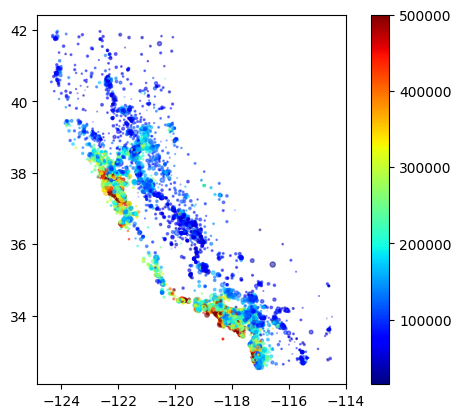

In [56]:
## Put data into GeoDataFrame:
## Inherit the geographic CRS from state_gdf:

data_gdf = gpd.GeoDataFrame(housing_train, geometry =
                            gpd.points_from_xy(housing_train.longitude, housing_train.latitude), crs = state_gdf.crs)

#To plot as GeoDataFrame:
data_gdf.plot(column = 'median_house_value', markersize = data_gdf['population'] / 500, alpha=.5, cmap='jet', legend=True)

In [57]:
data_gdf.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat,age_cat,age_income_cat,geometry
13096,-122.42,37.80,52.0,3321.0,1115.0,1576.0,1034.0,2.0987,458300.0,NEAR BAY,2,6,62,POINT (-122.42000 37.80000)
14973,-118.38,34.14,40.0,1965.0,354.0,666.0,357.0,6.0876,483800.0,<1H OCEAN,5,5,55,POINT (-118.38000 34.14000)
3785,-121.98,38.36,33.0,1083.0,217.0,562.0,203.0,2.4330,101700.0,INLAND,2,4,42,POINT (-121.98000 38.36000)
14689,-117.11,33.75,17.0,4174.0,851.0,1845.0,780.0,2.2618,96100.0,INLAND,2,2,22,POINT (-117.11000 33.75000)
20507,-118.15,33.77,36.0,4366.0,1211.0,1912.0,1172.0,3.5292,361800.0,NEAR OCEAN,3,5,53,POINT (-118.15000 33.77000)


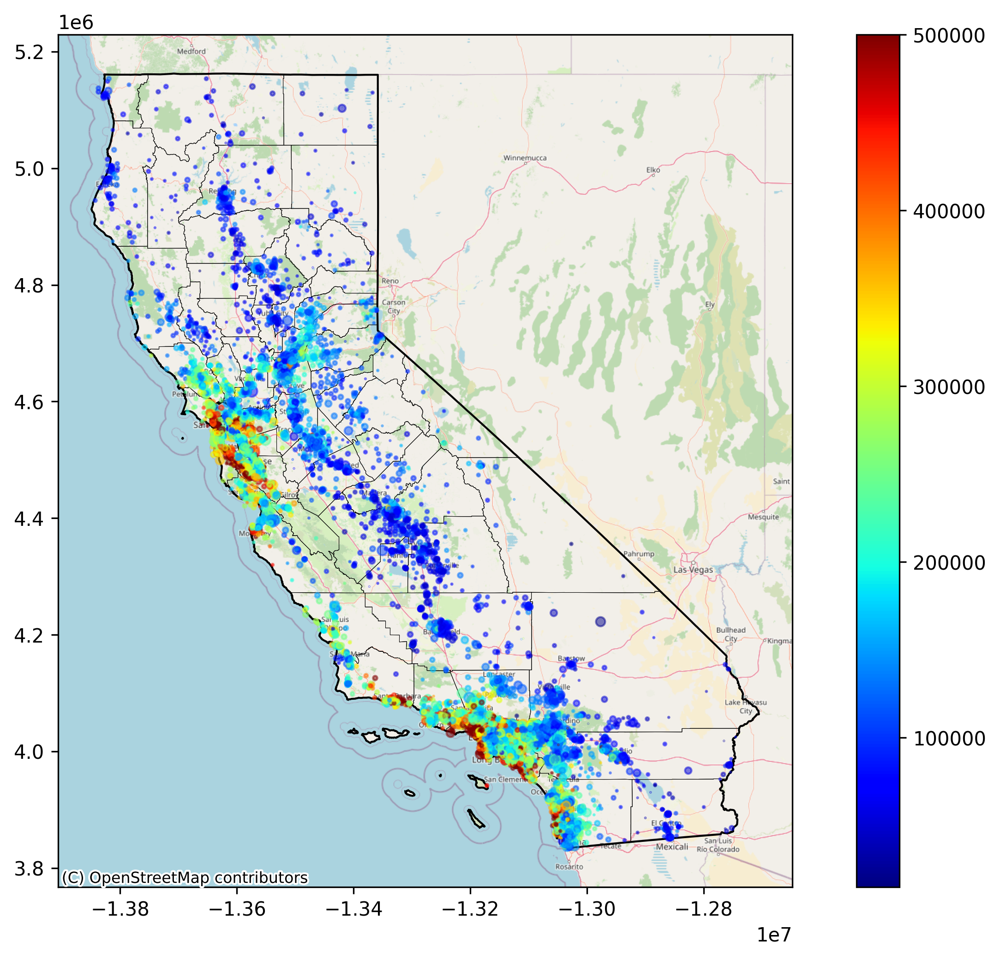

In [58]:
#Now plot everything in Mercator Projection:
#########
fig, ax1 = plt.subplots(1,1, figsize=(12,8),dpi=300)

#Convert everything to Mercator:
state_gdf_Mercator = state_gdf.to_crs(3857)
county_gdf_Mercator = county_gdf.to_crs(3857)
data_gdf_Mercator = data_gdf.to_crs(3857)

#06 is State FIPS code for California
state_gdf_Mercator.loc[state_gdf.STATEFP == '06'].plot(ax=ax1, facecolor='none', linewidth=1)
county_gdf_Mercator.loc[county_gdf.STATEFP == '06'].plot(ax=ax1, facecolor='none', linewidth=.25)
data_gdf_Mercator.plot(ax=ax1, column = 'median_house_value', markersize = data_gdf_Mercator['population'] / 300, alpha=.5, cmap='jet', legend=True)

#And add the basemap:
cx.add_basemap(ax1, source=cx.providers.OpenStreetMap.Mapnik) #source=cx.providers.Stamen.TonerLite


## Correlations

- Make a correlation matrix: Note that newer pandas does not automatically drop non-numeric columns
- Visualize all correlations
  
Note these do not capture non-linear relationships

- Wikipedia example
- The Datasaurus example

In [59]:
## Correlation Matrix
## Need to set numeric_only=True in newer pandas
corr_matrix = housing_train.corr(numeric_only=True)
corr_matrix

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924213,-0.102937,0.044558,0.068210,0.104236,0.054261,-0.016542,-0.050859
latitude,-0.924213,1.000000,0.005692,-0.036753,-0.066391,-0.115677,-0.071604,-0.078137,-0.139584
housing_median_age,-0.102937,0.005692,1.000000,-0.361710,-0.317978,-0.301906,-0.300075,-0.127043,0.102175
total_rooms,0.044558,-0.036753,-0.361710,1.000000,0.930076,0.863967,0.916143,0.197720,0.137455
total_bedrooms,0.068210,-0.066391,-0.317978,0.930076,1.000000,0.886200,0.978822,-0.006038,0.054635
population,0.104236,-0.115677,-0.301906,0.863967,0.886200,1.000000,0.916237,0.004282,-0.020153
households,0.054261,-0.071604,-0.300075,0.916143,0.978822,0.916237,1.000000,0.013637,0.071426
median_income,-0.016542,-0.078137,-0.127043,0.197720,-0.006038,0.004282,0.013637,1.000000,0.688380
median_house_value,-0.050859,-0.139584,0.102175,0.137455,0.054635,-0.020153,0.071426,0.688380,1.000000


In [60]:
#How do things correlate with median house value?
corr_matrix['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688380
total_rooms           0.137455
housing_median_age    0.102175
households            0.071426
total_bedrooms        0.054635
population           -0.020153
longitude            -0.050859
latitude             -0.139584
Name: median_house_value, dtype: float64

#### Visualize?

- Choose the 3 most correlated: `median_income`, `total_rooms`, `housing_median_age`

Can use either pandas `scatter_matrix` or seaborn `pairplot`


<ipython-input-61-b750bbf03b16>:10: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  scatter_matrix(housing_train[vars], ax=ax1);


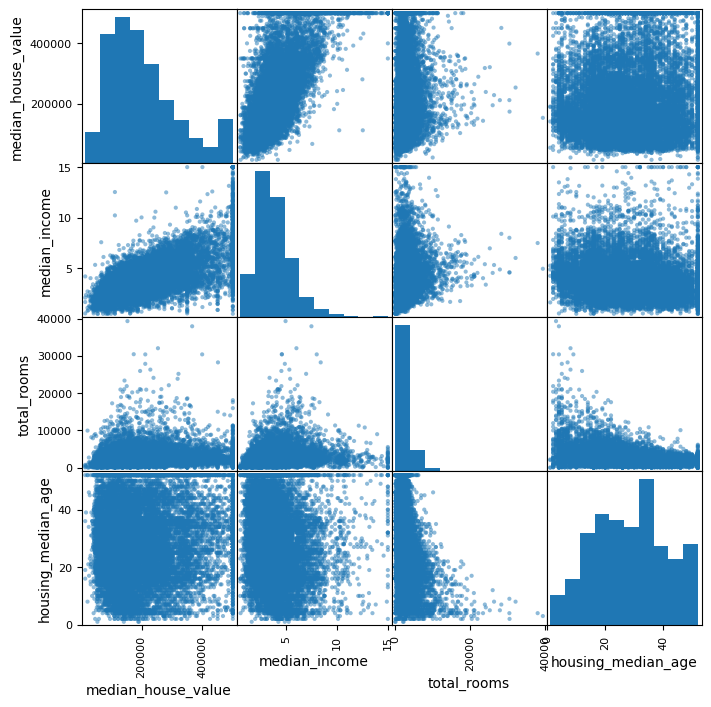

In [61]:
#Pandas:
###

from pandas.plotting import scatter_matrix

vars = ['median_house_value', 'median_income', 'total_rooms', 'housing_median_age']

fig, ax1 = plt.subplots(1,1, figsize=(8,8))

scatter_matrix(housing_train[vars], ax=ax1);

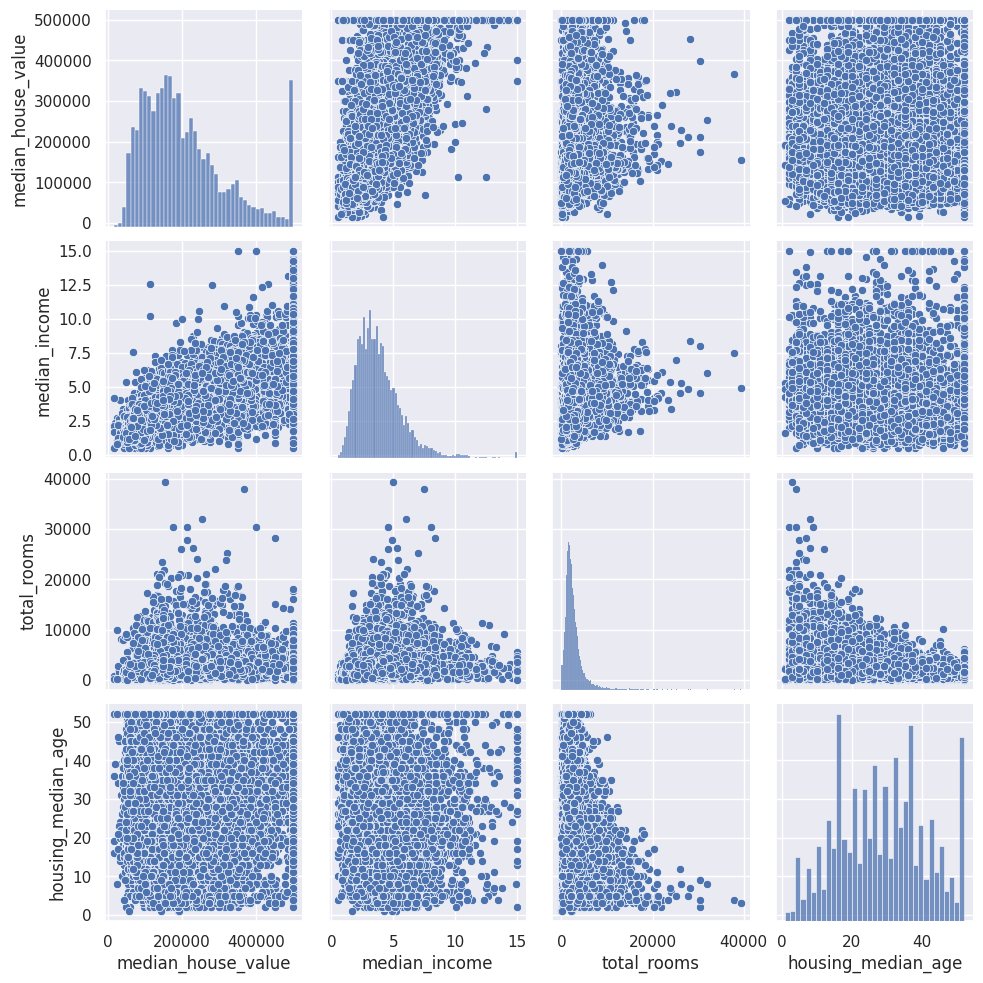

In [62]:
##Seaborn:
import seaborn as sns

#Set seaborn theme for this:
sns.set_theme()
sns.pairplot(data=housing_train[vars]) #, kind='reg')

#And reset:
sns.reset_orig()

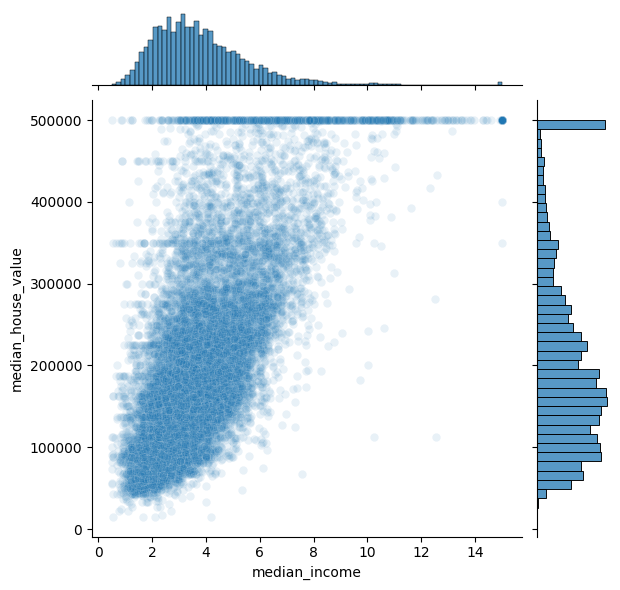

In [63]:
#Can also look at income and housing value as jointplot:

#Note the horizontal line at 500,000, but also subtle lines at 450, 350, and maybe 275, 225, etc.

sns.jointplot(data=housing_train, x="median_income", y="median_house_value", alpha=.1) #, kind='kde')

### Note that Correlation is Linear Only

<img src="https://github.com/seikenberry1/ML_Course/blob/main/Lectures/correlation_examples.png?raw=1" alt="Correlation Coefficients" style="width:900px;"/>

*Figure from Wikipedia*

### Consider the DataSaurus

<https://www.autodesk.com/research/publications/same-stats-different-graphs>

See also the **DrawMyData** tool: <http://robertgrantstats.co.uk/drawmydata.html>

In [64]:
#Load the tab-separated datasaurus data!
#datasaurus = pd.read_csv(r'Data/The Datasaurus Dozen/DatasaurusDozen.tsv', sep='\t')
datasaurus = pd.read_csv('https://raw.githubusercontent.com/seikenberry1/ML_Course/main/Lectures/Data/The%20Datasaurus%20Dozen/DatasaurusDozen.tsv', sep='\t')

datasaurus

,dataset,x,y
0,dino,55.384600,97.179500
1,dino,51.538500,96.025600
2,dino,46.153800,94.487200
3,dino,42.820500,91.410300
4,dino,40.769200,88.333300
...,...,...,...
1841,wide_lines,33.674442,26.090490
1842,wide_lines,75.627255,37.128752
1843,wide_lines,40.610125,89.136240
1844,wide_lines,39.114366,96.481751


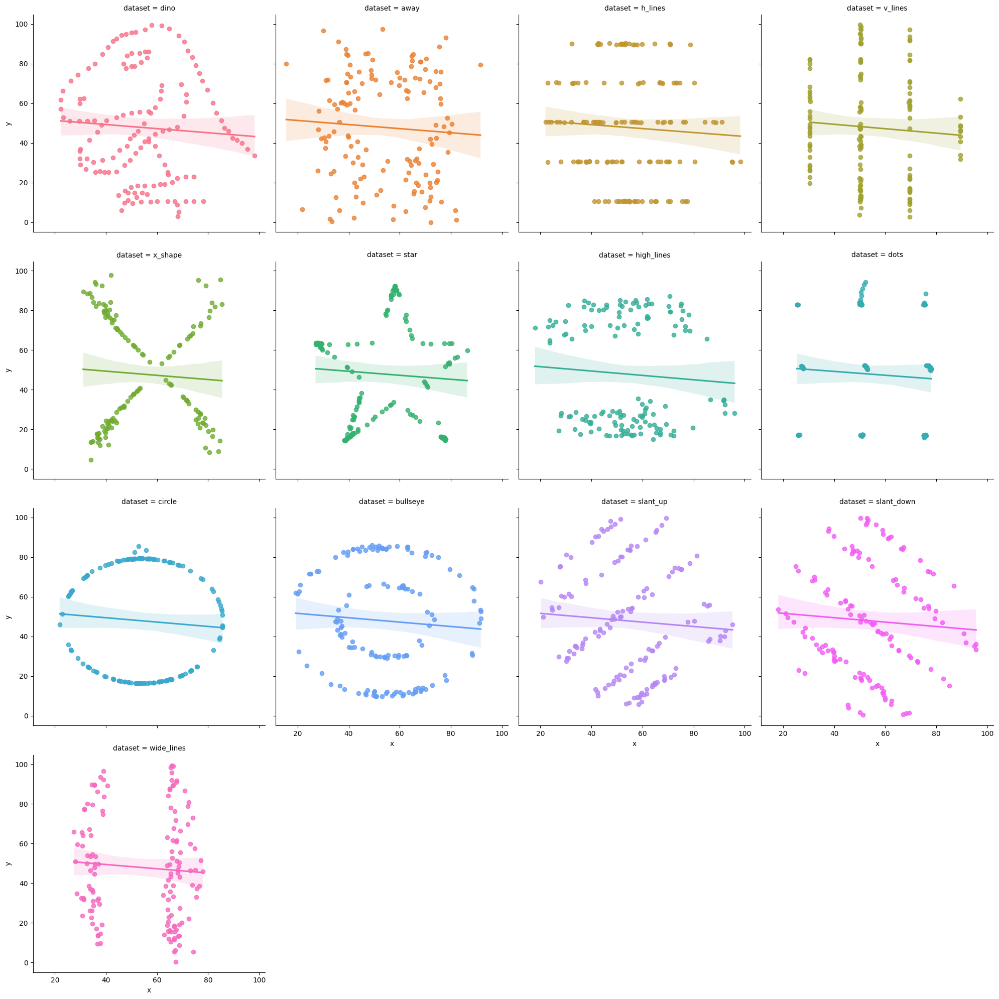

In [65]:
#Plot in seaborn:
#sns.relplot(data=datasaurus, x='x', y='y', hue='dataset', col='dataset', col_wrap=4, s=75)
sns.lmplot(data=datasaurus, x='x', y='y', hue='dataset', col='dataset', col_wrap=4)


In [66]:
#Confirm the minimal correlation coefficient:
dino = datasaurus.loc[datasaurus.dataset=='dino']

dino[['x', 'y']].corr()['y']

x   -0.064472
y    1.000000
Name: y, dtype: float64

## Derived Variables and Correlations

- Let's make some derived variables:

In [67]:
#Here they are:

housing_train["rooms_per_household"] = housing_train["total_rooms"] / housing_train["households"]
housing_train["bedrooms_ratio"] = housing_train["total_bedrooms"] / housing_train["total_rooms"]
housing_train["people_per_household"] = housing_train["population"] / housing_train["households"]

In [68]:
#And the correlations with median house value?
corr_matrix = housing_train.corr(numeric_only=True)

corr_matrix['median_house_value'].sort_values(ascending=False)


median_house_value      1.000000
median_income           0.688380
rooms_per_household     0.143663
total_rooms             0.137455
housing_median_age      0.102175
households              0.071426
total_bedrooms          0.054635
population             -0.020153
people_per_household   -0.038224
longitude              -0.050859
latitude               -0.139584
bedrooms_ratio         -0.256397
Name: median_house_value, dtype: float64

# Part 2: Prep the Data for Machine Learning

Four essential tasks:

1. Deal with missing data (imputation vs. drop)
2. Encode categorical as continuous (one-hot encoding vs. label encoding)
3. Split into inputs (predictors, features) and outputs (labels, targets)
    - Could do this first, but may want to wait if dropping observations with missing data to make sure everything lines up correctly
4. **Feature scaling** + Feature transformation


In [169]:
#Reset our training data here:
#And our test set too:
######

train_df, test_df = train_test_split(housing, test_size=.2, random_state=42, stratify = housing['income_cat'])
housing_train = train_df.copy()
housing_test = test_df.copy()

## 1. Deal With Missing Data?

Generally we cannot have missing data (NaNs) when we feed the data to the linear algebra black box. So, for any attribute with missing data, we have three options:

1. Drop the missing observations
   - `drop()`
2. Drop the whole attribute
   - `dropna()`
3. Impute the missing values to something else. Common choices = 0, mean/median, or some regression approach
   - `fillna()`
   - Other imputer
  
Note we typically drop anything with missing output

In [170]:
## We have some missing data in total_bedrooms
## Can see from inspection here:

housing_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16512 entries, 13096 to 19888
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           16512 non-null  float64 
 1   latitude            16512 non-null  float64 
 2   housing_median_age  16512 non-null  float64 
 3   total_rooms         16512 non-null  float64 
 4   total_bedrooms      16344 non-null  float64 
 5   population          16512 non-null  float64 
 6   households          16512 non-null  float64 
 7   median_income       16512 non-null  float64 
 8   median_house_value  16512 non-null  float64 
 9   ocean_proximity     16512 non-null  object  
 10  income_cat          16512 non-null  category
 11  age_cat             16512 non-null  category
 12  age_income_cat      16512 non-null  object  
dtypes: category(2), float64(9), object(2)
memory usage: 1.5+ MB


In [171]:
#Could also use:
####

housing_train.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        168
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
income_cat              0
age_cat                 0
age_income_cat          0
dtype: int64

In [172]:
## Our three basic options:
#####

#1. Drop
#housing_train = housing_train.drop('total_bedrooms', axis=1)

#2. Drop NaNs:
#housing_train = housing_train.dropna(subset=['total_bedrooms'])

#3. Impute/fillna:
#median_value = housing_train['total_bedrooms'].median()
#housing_train['total_bedrooms'] = housing_train['total_bedrooms'].fillna(median_value)

In [173]:
#Tag what was null, for comparison purposes later:
housing_train['bed_null'] = housing_train['total_bedrooms'].isna()

### Use scikit-learn imputers:

- `SimpleImputer`
- `KNNImputer`
- `IterativeImputer`

In [174]:
housing_train_filled = housing_train.copy()

In [175]:
#Try filling with SimpleImputer:
from sklearn.impute import SimpleImputer

#Possible strategies:
#mean
#median
#most_frequent: This will also work with strings
#constant, use fill_value =
imputer = SimpleImputer(strategy='median')

#Restrict to only the numeric data types:
housing_num = housing_train.select_dtypes(include=[np.number])

#Can do either the fit and transform in sequence:
if (0):
    imputer.fit(housing_num)
    impute_results = imputer.transform(housing_num)
else:
    #Or in a single operation:
    impute_results = imputer.fit_transform(housing_num)

#We get a numpy array as output
#Check out output shape
impute_results.shape

(16512, 9)

In [176]:
impute_results

array([[-1.22420e+02,  3.78000e+01,  5.20000e+01, ...,  1.03400e+03,
         2.09870e+00,  4.58300e+05],
       [-1.18380e+02,  3.41400e+01,  4.00000e+01, ...,  3.57000e+02,
         6.08760e+00,  4.83800e+05],
       [-1.21980e+02,  3.83600e+01,  3.30000e+01, ...,  2.03000e+02,
         2.43300e+00,  1.01700e+05],
       ...,
       [-1.17060e+02,  3.25900e+01,  1.30000e+01, ...,  7.60000e+02,
         4.06160e+00,  1.48800e+05],
       [-1.18400e+02,  3.40600e+01,  3.70000e+01, ...,  8.38000e+02,
         4.14550e+00,  5.00001e+05],
       [-1.22410e+02,  3.76600e+01,  4.40000e+01, ...,  2.12000e+02,
         3.28330e+00,  2.33300e+05]])

### Get back to DataFrame from numpy:

In [177]:
#Let's put back into a DataFrame!
###
housing_num_df = pd.DataFrame(impute_results, columns = housing_num.columns,
                              index = housing_num.index)

housing_num_df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
13096,-122.42,37.80,52.0,3321.0,1115.0,1576.0,1034.0,2.0987,458300.0
14973,-118.38,34.14,40.0,1965.0,354.0,666.0,357.0,6.0876,483800.0
3785,-121.98,38.36,33.0,1083.0,217.0,562.0,203.0,2.4330,101700.0
14689,-117.11,33.75,17.0,4174.0,851.0,1845.0,780.0,2.2618,96100.0
20507,-118.15,33.77,36.0,4366.0,1211.0,1912.0,1172.0,3.5292,361800.0
...,...,...,...,...,...,...,...,...,...
14207,-118.40,33.86,41.0,2237.0,597.0,938.0,523.0,4.7105,500001.0
13105,-119.31,36.32,23.0,2945.0,592.0,1419.0,532.0,2.5733,88800.0
19301,-117.06,32.59,13.0,3920.0,775.0,2814.0,760.0,4.0616,148800.0
19121,-118.40,34.06,37.0,3781.0,873.0,1725.0,838.0,4.1455,500001.0


In [178]:
#Now we can put back into our "filled" DataFrame that also has categorical variables
#
#Could use simply:
#housing_train_filled['total_bedrooms'] = impute_results[:,4]

#But this is safer: Do note that the index needs to line up, which we assured with the construction above
housing_train_filled['total_bedrooms'] = housing_num_df['total_bedrooms']

<Axes: xlabel='median_house_value', ylabel='total_bedrooms'>

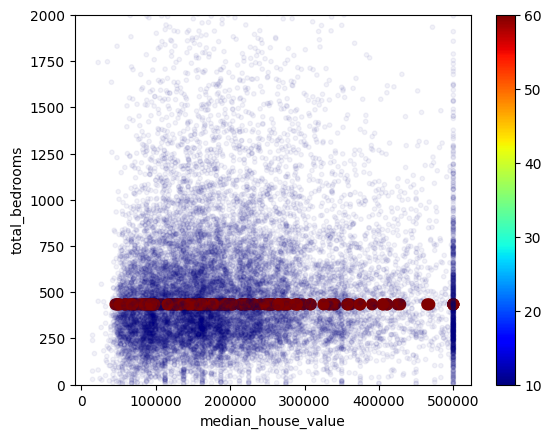

In [179]:
#How did this do?
######

housing_train_filled.plot(kind='scatter', x='median_house_value', y='total_bedrooms',
                          s=housing_train_filled['bed_null'].astype(int)*50+10,
                          c=housing_train_filled['bed_null'].astype(int)*50+10,
                          alpha=housing_train_filled['bed_null'].astype(int)*.95 + .05,
                          cmap='jet', ylim=[0,2000])

#### KNN and Iterative Imputers

In [180]:
#Use a KNN Imputer method
############

from sklearn.impute import KNNImputer

#Restrict to only the numeric data types:
housing_num = housing_train.select_dtypes(include=[np.number])

#Imputation:
imputer = KNNImputer(n_neighbors=10)
impute_results = imputer.fit_transform(housing_num)

#We get a numpy array as output
#Check out output shape
impute_results.shape

(16512, 9)

In [181]:
#Try with the KNN Imputed results:
#Just quick and easy:
housing_train_filled['total_bedrooms'] = impute_results[:,4]

<Axes: xlabel='median_house_value', ylabel='total_bedrooms'>

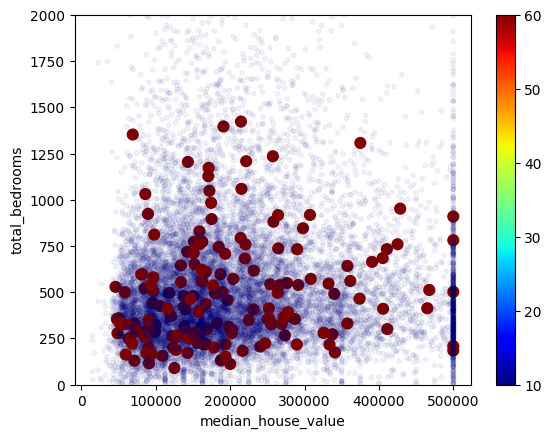

In [182]:
#And now what did we get??
######

housing_train_filled.plot(kind='scatter', x='median_house_value', y='total_bedrooms',
                          s=housing_train_filled['bed_null'].astype(int)*50+10,
                          c=housing_train_filled['bed_null'].astype(int)*50+10,
                          alpha=housing_train_filled['bed_null'].astype(int)*.95 + .05,
                          cmap='jet', ylim=[0,2000])

In [183]:
#Finally, use an interative regression method:
############
#We need to import this as well, since this is still an experimental method:
from sklearn.experimental import enable_iterative_imputer

from sklearn.impute import IterativeImputer


imputer = IterativeImputer()

#Restrict to only the numeric data types:
housing_num = housing_train.select_dtypes(include=[np.number])

#Imputation:
imputer = IterativeImputer()
impute_results = imputer.fit_transform(housing_num)

#Go ahead and fill:
housing_train_filled['total_bedrooms'] = impute_results[:,4]

<Axes: xlabel='median_house_value', ylabel='total_bedrooms'>

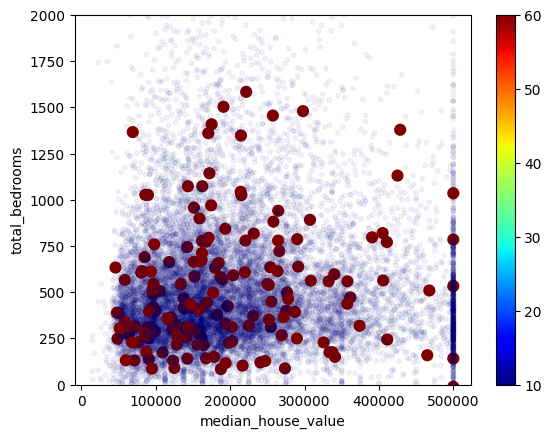

In [184]:
#And plot again...
######

housing_train_filled.plot(kind='scatter', x='median_house_value', y='total_bedrooms',
                          s=housing_train_filled['bed_null'].astype(int)*50+10,
                          c=housing_train_filled['bed_null'].astype(int)*50+10,
                          alpha=housing_train_filled['bed_null'].astype(int)*.95 + .05,
                          cmap='jet', ylim=[0,2000])

## What About the *Test* Data?

- Use the same pipeline you developed for the train dataset, **using only the training data**
- If you calculated mean/median, etc. for the test dataset, that would give you information about it! This is sometimes called "Data Leakage"

In [185]:
##Let's go with KNN for both the train and test data:
######

from sklearn.impute import KNNImputer

#Restrict to only the numeric data types:
housing_num = housing_train.select_dtypes(include=[np.number])

#Imputation:
imputer = KNNImputer(n_neighbors=10)
impute_results = imputer.fit_transform(housing_num)

#Put into housing_train, now:
housing_train['total_bedrooms'] = impute_results[:,4]

#Also, do this for the test data:
#Note, we do NOT re-fit:
housing_num = housing_test.select_dtypes(include=[np.number])
impute_results_test = imputer.transform(housing_num)
housing_test['total_bedrooms'] = impute_results_test[:,4]

## 2. Deal with Categorical Data

- We have one categorical variable in this dataset: `ocean_proximity`
- Let's convert to continuous number

In [186]:
#Note that it matters a lot whether you make a Series or a DataFrame in the following:
housing_cat = housing_train['ocean_proximity']
housing_cat

13096      NEAR BAY
14973     <1H OCEAN
3785         INLAND
14689        INLAND
20507    NEAR OCEAN
            ...    
14207     <1H OCEAN
13105        INLAND
19301    NEAR OCEAN
19121     <1H OCEAN
19888    NEAR OCEAN
Name: ocean_proximity, Length: 16512, dtype: object

In [187]:
#Vs:
housing_cat = housing_train[['ocean_proximity']]
housing_cat

,ocean_proximity
13096,NEAR BAY
14973,<1H OCEAN
3785,INLAND
14689,INLAND
20507,NEAR OCEAN
...,...
14207,<1H OCEAN
13105,INLAND
19301,NEAR OCEAN
19121,<1H OCEAN


In [188]:
housing_cat['ocean_proximity'].unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

### Option 1: Ordinal Encoding

- Easy with scikit-learn...

In [189]:
#We'll need to reshape for this if we use a Series:
housing_cat = housing_train['ocean_proximity']
housing_cat

housing_cat.values.reshape(-1,1) #.shape

array([['NEAR BAY'],
       ['<1H OCEAN'],
       ['INLAND'],
       ...,
       ['NEAR OCEAN'],
       ['<1H OCEAN'],
       ['NEAR OCEAN']], dtype=object)

In [190]:
#But let's stick with a DataFrame:
housing_cat = housing_train[['ocean_proximity']]


In [191]:
from sklearn.preprocessing import OrdinalEncoder

ordinal_encoder = OrdinalEncoder()

#Use this if you make a Series:
#housing_cat_encoded = ordinal_encoder.fit_transform(housing_cat.values.reshape(-1,1))

#This if you make a DataFrame:
housing_cat_encoded = ordinal_encoder.fit_transform(housing_cat)

In [192]:
housing_cat_encoded

array([[3.],
       [0.],
       [1.],
       ...,
       [4.],
       [0.],
       [4.]])

In [193]:
#These don't order very well by default:
ordinal_encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

In [194]:
#Could try this to give a more sensible order:
####
ordinal_encoder = OrdinalEncoder(categories=[['ISLAND', 'NEAR BAY', 'NEAR OCEAN', '<1H OCEAN', 'INLAND']])

housing_cat_ordinal = ordinal_encoder.fit_transform(housing_cat)

housing_cat_ordinal

array([[1.],
       [3.],
       [4.],
       ...,
       [2.],
       [3.],
       [2.]])

#### Back to pandas is pretty simple with an ordinal encoding:

In [95]:
##To put back in our DataFrame:
#housing_train['ocean_proximity'] = housing_cat_ordinal

### Option 2: One-Hot Encoding

- If $n$ is the number of categories, create $n$ dummy variables, each either $0$ or $1$
- For any observation, only one of these dummy variables will be $1$
- Can do with scikit-learn, of course:

In [195]:
from sklearn.preprocessing import OneHotEncoder

cat_encoder = OneHotEncoder()  #sparse = False

#The usual fit_transform:
housing_cat_1hot = cat_encoder.fit_transform(housing_train[['ocean_proximity']])

#We get a sparse matrix by default:
#As this matrix contains mostly zeros, sparse matrix representation is more efficient, but not what we want here
#Can just uncomment sparse = False above
housing_cat_1hot

<16512x5 sparse matrix of type '<class 'numpy.float64'>'
	with 16512 stored elements in Compressed Sparse Row format>

In [196]:
#Or convert to a dense array:
housing_cat_1hot.toarray()

array([[0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.]])

In [197]:
#Compare to:
housing_cat['ocean_proximity']

13096      NEAR BAY
14973     <1H OCEAN
3785         INLAND
14689        INLAND
20507    NEAR OCEAN
            ...    
14207     <1H OCEAN
13105        INLAND
19301    NEAR OCEAN
19121     <1H OCEAN
19888    NEAR OCEAN
Name: ocean_proximity, Length: 16512, dtype: object

In [198]:
#And the categories encoding:
cat_encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

#### Safer to avoid pandas `get_dummies`:

To see why:

In [199]:
#Make a simple test dataset with only two of the categories represented:
df_test = pd.DataFrame({"ocean_proximity": ["INLAND", "NEAR BAY"]})

pd.get_dummies(df_test)


,ocean_proximity_INLAND,ocean_proximity_NEAR BAY
0,1,0
1,0,1


In [200]:
#Compare to using our 1-Hot encoder from above:
#We preserve all categories
cat_encoder.transform(df_test.values.reshape(-1,1)).toarray()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


array([[0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0.]])

In [201]:
#What if we put an unknown category in?
#get_dummies no problem:
df_test = pd.DataFrame({"ocean_proximity": ["INLAND", "MOUNTAIN"]})

pd.get_dummies(df_test)

,ocean_proximity_INLAND,ocean_proximity_MOUNTAIN
0,1,0
1,0,1


In [202]:
#Get error using our 1-Hot encoder from above:
cat_encoder.transform(df_test.values.reshape(-1,1)).toarray()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


ValueError: ignored

In [203]:
#Can do this instead: Ignore unknown categories
cat_encoder.handle_unknown = 'ignore'

#Now it should succeed!
cat_encoder.transform(df_test.values.reshape(-1,1)).toarray()


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


array([[0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

### Getting back to pandas??

- We have the feature names that we transformed in `feature_names_in_`, but ONLY if we used a DataFrame above (doesn't work if we used a Series)
- Get the new column names with `get_feature_names_out()`

In [204]:
cat_encoder.feature_names_in_

array(['ocean_proximity'], dtype=object)

In [205]:
cat_encoder.get_feature_names_out()

array(['ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
       'ocean_proximity_NEAR OCEAN'], dtype=object)

In [206]:
#Make our new pandas columns/DataFrame

#Let's remake housing_cat_1hot for clarity:
#Make as a dense array
housing_cat_1hot = cat_encoder.transform(housing_train[['ocean_proximity']]).toarray()

df_output = pd.DataFrame(housing_cat_1hot,
                         columns = cat_encoder.get_feature_names_out(),
                         index = housing_train.index)

df_output

,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
13096,0.0,0.0,0.0,1.0,0.0
14973,1.0,0.0,0.0,0.0,0.0
3785,0.0,1.0,0.0,0.0,0.0
14689,0.0,1.0,0.0,0.0,0.0
20507,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...
14207,1.0,0.0,0.0,0.0,0.0
13105,0.0,1.0,0.0,0.0,0.0
19301,0.0,0.0,0.0,0.0,1.0
19121,1.0,0.0,0.0,0.0,0.0


#### Merge back into the training set on the index

In [207]:
#Awesome, now let's put it into our training set:
###############

housing_train = housing_train.merge(df_output, left_index=True, right_index=True)
housing_train

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat,age_cat,age_income_cat,bed_null,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
13096,-122.42,37.80,52.0,3321.0,1115.0,1576.0,1034.0,2.0987,458300.0,NEAR BAY,2,6,62,False,0.0,0.0,0.0,1.0,0.0
14973,-118.38,34.14,40.0,1965.0,354.0,666.0,357.0,6.0876,483800.0,<1H OCEAN,5,5,55,False,1.0,0.0,0.0,0.0,0.0
3785,-121.98,38.36,33.0,1083.0,217.0,562.0,203.0,2.4330,101700.0,INLAND,2,4,42,False,0.0,1.0,0.0,0.0,0.0
14689,-117.11,33.75,17.0,4174.0,851.0,1845.0,780.0,2.2618,96100.0,INLAND,2,2,22,False,0.0,1.0,0.0,0.0,0.0
20507,-118.15,33.77,36.0,4366.0,1211.0,1912.0,1172.0,3.5292,361800.0,NEAR OCEAN,3,5,53,False,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14207,-118.40,33.86,41.0,2237.0,597.0,938.0,523.0,4.7105,500001.0,<1H OCEAN,4,5,54,False,1.0,0.0,0.0,0.0,0.0
13105,-119.31,36.32,23.0,2945.0,592.0,1419.0,532.0,2.5733,88800.0,INLAND,2,3,32,False,0.0,1.0,0.0,0.0,0.0
19301,-117.06,32.59,13.0,3920.0,775.0,2814.0,760.0,4.0616,148800.0,NEAR OCEAN,3,2,23,False,0.0,0.0,0.0,0.0,1.0
19121,-118.40,34.06,37.0,3781.0,873.0,1725.0,838.0,4.1455,500001.0,<1H OCEAN,3,5,53,False,1.0,0.0,0.0,0.0,0.0


In [208]:
#We can now drop the ocean_proximity column
housing_train = housing_train.drop(columns = ['ocean_proximity'])

### Also, perform encoding on test data

In [209]:
#Copy/paste but with test data:
######

housing_cat_1hot = cat_encoder.transform(housing_test[['ocean_proximity']]).toarray()

df_output = pd.DataFrame(housing_cat_1hot,
                         columns = cat_encoder.get_feature_names_out(),
                         index = housing_test.index)

df_output

,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
3905,1.0,0.0,0.0,0.0,0.0
16821,1.0,0.0,0.0,0.0,0.0
2900,0.0,0.0,0.0,0.0,1.0
7193,0.0,0.0,0.0,0.0,1.0
13928,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...
12369,0.0,0.0,0.0,0.0,1.0
8707,0.0,1.0,0.0,0.0,0.0
16634,1.0,0.0,0.0,0.0,0.0
9779,0.0,0.0,0.0,1.0,0.0


In [210]:
#Merge in to test data:
####

housing_test = housing_test.merge(df_output, left_index=True, right_index=True)
housing_test

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat,age_cat,age_income_cat,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
3905,-121.95,37.11,21.0,2387.0,357.0,913.0,341.0,7.7360,397700.0,<1H OCEAN,5,3,35,1.0,0.0,0.0,0.0,0.0
16821,-118.01,33.89,36.0,1589.0,265.0,804.0,272.0,4.6354,202900.0,<1H OCEAN,4,5,54,1.0,0.0,0.0,0.0,0.0
2900,-118.18,33.74,30.0,5915.0,1750.0,2136.0,1503.0,4.0968,310000.0,NEAR OCEAN,3,4,43,0.0,0.0,0.0,0.0,1.0
7193,-122.48,37.74,52.0,2166.0,423.0,1072.0,370.0,4.1310,314300.0,NEAR OCEAN,3,6,63,0.0,0.0,0.0,0.0,1.0
13928,-122.39,37.78,5.0,1405.0,515.0,725.0,392.0,3.6037,187500.0,NEAR BAY,3,1,13,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12369,-124.16,40.79,46.0,3042.0,597.0,1206.0,541.0,2.1135,90600.0,NEAR OCEAN,2,6,62,0.0,0.0,0.0,0.0,1.0
8707,-119.01,35.39,29.0,1820.0,459.0,1134.0,419.0,1.8289,59400.0,INLAND,2,4,42,0.0,1.0,0.0,0.0,0.0
16634,-123.01,38.67,33.0,914.0,147.0,394.0,132.0,4.6875,246200.0,<1H OCEAN,4,4,44,1.0,0.0,0.0,0.0,0.0
9779,-122.03,37.60,24.0,2077.0,383.0,1488.0,389.0,4.5721,214700.0,NEAR BAY,4,3,34,0.0,0.0,0.0,1.0,0.0


In [211]:
#And drop ocean_proximity column
housing_test = housing_test.drop(columns = ['ocean_proximity'])

## 3. Split Data into Predictors and Labels:

- Let's clear out any of the helper columns we created earlier: Drop `age_cat`, `income_cat`, `age_income_cat`, and `bed_null`
- And divide our datasets into inputs and outputs

In [212]:
#Reminder of what we have:
housing_train.head()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,income_cat,age_cat,age_income_cat,bed_null,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
13096,-122.42,37.80,52.0,3321.0,1115.0,1576.0,1034.0,2.0987,458300.0,2,6,62,False,0.0,0.0,0.0,1.0,0.0
14973,-118.38,34.14,40.0,1965.0,354.0,666.0,357.0,6.0876,483800.0,5,5,55,False,1.0,0.0,0.0,0.0,0.0
3785,-121.98,38.36,33.0,1083.0,217.0,562.0,203.0,2.4330,101700.0,2,4,42,False,0.0,1.0,0.0,0.0,0.0
14689,-117.11,33.75,17.0,4174.0,851.0,1845.0,780.0,2.2618,96100.0,2,2,22,False,0.0,1.0,0.0,0.0,0.0
20507,-118.15,33.77,36.0,4366.0,1211.0,1912.0,1172.0,3.5292,361800.0,3,5,53,False,0.0,0.0,0.0,0.0,1.0


In [213]:
#X is our inputs = everything but the target output
#Also drop the helper columns from before:
X_train = housing_train.drop(['median_house_value', 'age_cat', 'income_cat', 'age_income_cat', 'bed_null'], axis=1)
X_test = housing_test.drop(['median_house_value', 'age_cat', 'income_cat', 'age_income_cat'], axis=1)

#Output/labels
y_train = housing_train['median_house_value'].copy()
y_test = housing_test['median_house_value'].copy()

In [214]:
#Confirm our shapes all check out
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(16512, 13)
(16512,)
(4128, 13)
(4128,)


In [215]:
#Make sure we don't have any missing data:
print(X_train.isnull().sum().sum())
print(X_test.isnull().sum().sum())
print(y_train.isnull().sum())
print(y_test.isnull().sum())

0
0
0
0


In [216]:
#And confirm no overlap between our train/test:
print(np.sum([int(i) in X_train.index for i in X_test.index]))
print(np.sum([int(i) in y_train.index for i in y_test.index]))

0
0


## 4. Feature Scaling and Transformation

- Important for most ML algorithms to rescale features so they have comparable scales (linear regression is a notable exception, but only when not using regularization; trees are also insensitive to normalization)
- `total_rooms` ranges from 2 to 39,320; `median_income` ranges from 0 to 15
- Without rescaling, most algorithms with put most emphasis on `total_rooms` and practically ignore `median_income`
- Rescaling also improves gradient descent algorithms
- Rescaling of output/target generally not necessary
  
Two common rescalings:

1. Min-max (normalization to range from 0 to 1; sometimes may use -1 to 1 or other range)
2. Standardization (zero-mean, unit standard deviation)

Min-max normalization is calculated as follows:

$$
x_{norm} = \frac{x - x_{min}}{x_{max} - x_{min}}
$$

To standardize, we simply subtract the mean and divide by the standard deviation
$$
x_{standard} = \frac{x - \bar{x}}{\sigma_x}
$$

#### Caution: Only train scalers on the training data!

Fit the scaler to training data, then use the fit scaler to transform the test data

#### 1. Min-Max Scaler

- Sensitive to outliers
- Let's only scale the original numeric predictors, not the One-Hot Encodings for our categorical variable

In [217]:
#Here are our numeric predictors:
X_train.iloc[:,0:8]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
13096,-122.42,37.80,52.0,3321.0,1115.0,1576.0,1034.0,2.0987
14973,-118.38,34.14,40.0,1965.0,354.0,666.0,357.0,6.0876
3785,-121.98,38.36,33.0,1083.0,217.0,562.0,203.0,2.4330
14689,-117.11,33.75,17.0,4174.0,851.0,1845.0,780.0,2.2618
20507,-118.15,33.77,36.0,4366.0,1211.0,1912.0,1172.0,3.5292
...,...,...,...,...,...,...,...,...
14207,-118.40,33.86,41.0,2237.0,597.0,938.0,523.0,4.7105
13105,-119.31,36.32,23.0,2945.0,592.0,1419.0,532.0,2.5733
19301,-117.06,32.59,13.0,3920.0,775.0,2814.0,760.0,4.0616
19121,-118.40,34.06,37.0,3781.0,873.0,1725.0,838.0,4.1455


In [218]:
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler() #feature_range=(-1, 1))

X_train_subset = X_train.iloc[:,0:8]

#Fit-transform
X_train_subset_min_max_scaled = min_max_scaler.fit_transform(X_train_subset)
#numpy result:
X_train_subset_min_max_scaled

array([[0.19574037, 0.55851064, 1.        , ..., 0.09649123, 0.19283181,
        0.11026055],
       [0.60547667, 0.16914894, 0.76470588, ..., 0.04066986, 0.06645511,
        0.38535331],
       [0.24036511, 0.61808511, 0.62745098, ..., 0.03429027, 0.03770767,
        0.1333154 ],
       ...,
       [0.73935091, 0.00425532, 0.23529412, ..., 0.17243283, 0.14168378,
        0.24563109],
       [0.60344828, 0.1606383 , 0.70588235, ..., 0.10563121, 0.15624417,
        0.25141722],
       [0.19675456, 0.54361702, 0.84313725, ..., 0.04165133, 0.03938772,
        0.19195597]])

In [219]:
#As DataFrame:
pd.DataFrame(X_train_subset_min_max_scaled, columns = X_train_subset.columns,
                              index = X_train_subset.index)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
13096,0.195740,0.558511,1.000000,0.084414,0.179417,0.096491,0.192832,0.110261
14973,0.605477,0.169149,0.764706,0.049926,0.056853,0.040670,0.066455,0.385353
3785,0.240365,0.618085,0.627451,0.027494,0.034788,0.034290,0.037708,0.133315
14689,0.734280,0.127660,0.313725,0.106109,0.136898,0.112992,0.145417,0.121509
20507,0.628803,0.129787,0.686275,0.110992,0.194878,0.117102,0.218592,0.208914
...,...,...,...,...,...,...,...,...
14207,0.603448,0.139362,0.784314,0.056844,0.095990,0.057355,0.097443,0.290382
13105,0.511156,0.401064,0.431373,0.074851,0.095184,0.086861,0.099123,0.142991
19301,0.739351,0.004255,0.235294,0.099649,0.124658,0.172433,0.141684,0.245631
19121,0.603448,0.160638,0.705882,0.096114,0.140441,0.105631,0.156244,0.251417


#### 2. Standard Scaler

- Distribution need not be Gaussian
- But, often better if not highly skewed

In [220]:
from sklearn.preprocessing import StandardScaler

X_train_subset = X_train.iloc[:,0:8]

std_scaler = StandardScaler()

#Fit-transform
X_train_subset_std_scaled = std_scaler.fit_transform(X_train_subset)

#numpy result:
#X_train_subset_std_scaled

#As DataFrame:
pd.DataFrame(X_train_subset_std_scaled, columns = X_train_subset.columns,
                              index = X_train_subset.index)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
13096,-1.423037,1.013606,1.861119,0.311912,1.363750,0.137460,1.394812,-0.936491
14973,0.596394,-0.702103,0.907630,-0.308620,-0.436504,-0.693771,-0.373485,1.171942
3785,-1.203098,1.276119,0.351428,-0.712240,-0.760597,-0.788768,-0.775727,-0.759789
14689,1.231216,-0.884924,-0.919891,0.702262,0.739221,0.383175,0.731375,-0.850281
20507,0.711362,-0.875549,0.589800,0.790125,1.590852,0.444376,1.755263,-0.180365
...,...,...,...,...,...,...,...,...
14207,0.586397,-0.833359,0.987087,-0.184147,0.138347,-0.445315,0.060101,0.444041
13105,0.131525,0.319822,-0.443146,0.139847,0.126519,-0.005950,0.083608,-0.685630
19301,1.256209,-1.428701,-1.237721,0.586026,0.559432,1.268299,0.679135,0.101049
19121,0.586397,-0.739605,0.669257,0.522417,0.791265,0.273563,0.882868,0.145396


### Go Ahead and Apply the Standard Scaler:

In [221]:
from sklearn.preprocessing import StandardScaler

X_train_subset = X_train.iloc[:,0:8]

std_scaler = StandardScaler()

#Fit-transform
X_train_subset_std_scaled = std_scaler.fit_transform(X_train_subset)

#And overwrite:
#Note: If you're going to overwrite, only run the cell once!
X_train.iloc[:,0:8] = pd.DataFrame(X_train_subset_std_scaled, columns = X_train_subset.columns,
                              index = X_train_subset.index)

In [222]:
## Similar for Testing Data:
## But we use the scaler already fit on the testing data

X_test_subset = X_test.iloc[:,0:8]

#Transform only
X_test_subset_std_scaled = std_scaler.transform(X_test_subset)

#And overwrite:
#Note: If you're going to overwrite, only run the cell once!
X_test.iloc[:,0:8] = pd.DataFrame(X_test_subset_std_scaled, columns = X_test_subset.columns,
                              index = X_test_subset.index)

In [224]:
X_test

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
3905,-1.188103,0.690153,-0.602061,-0.115504,-0.429407,-0.468151,-0.415276,2.043245,1.0,0.0,0.0,0.0,0.0
16821,0.781342,-0.819296,0.589800,-0.480685,-0.647047,-0.567716,-0.595501,0.404345,1.0,0.0,0.0,0.0,0.0
2900,0.696366,-0.889612,0.113056,1.498977,2.865934,0.648987,2.619822,0.119655,0.0,0.0,0.0,0.0,1.0
7193,-1.453028,0.985480,1.861119,-0.216638,-0.273275,-0.322914,-0.339529,0.137732,0.0,0.0,0.0,0.0,1.0
13928,-1.408041,1.004230,-1.873380,-0.564887,-0.055636,-0.639878,-0.282066,-0.140986,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12369,-2.292791,2.415237,1.384374,0.184236,0.138347,-0.200513,0.107116,-0.928669,0.0,0.0,0.0,0.0,1.0
8707,0.281483,-0.116137,0.033598,-0.374975,-0.188112,-0.266281,-0.211543,-1.079101,0.0,1.0,0.0,0.0,0.0
16634,-1.717953,1.421438,0.351428,-0.789578,-0.926192,-0.942226,-0.961176,0.431884,1.0,0.0,0.0,0.0,0.0
9779,-1.228091,0.919851,-0.363689,-0.257367,-0.367901,0.057077,-0.289902,0.370886,0.0,0.0,0.0,1.0,0.0


### Feature Transformation

- Square root
- Other power
- Log-transform
- Bucketization

Consider population on a linear vs. a log scale below:

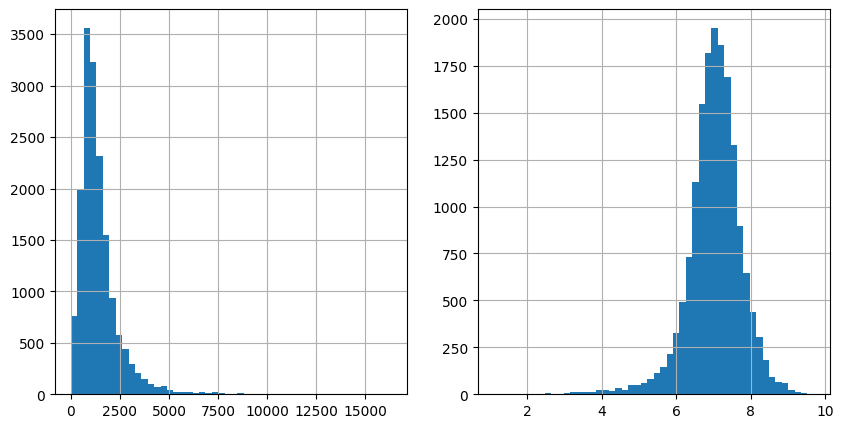

In [225]:
fig, ax1 = plt.subplots(1,2, figsize=(10,5))

#Using our un-scaled data:
housing_train['population'].hist(ax=ax1[0], bins=50);

#With a log-transformation, it is nearly Gaussian
np.log(housing_train['population']).hist(ax=ax1[1], bins=50);


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


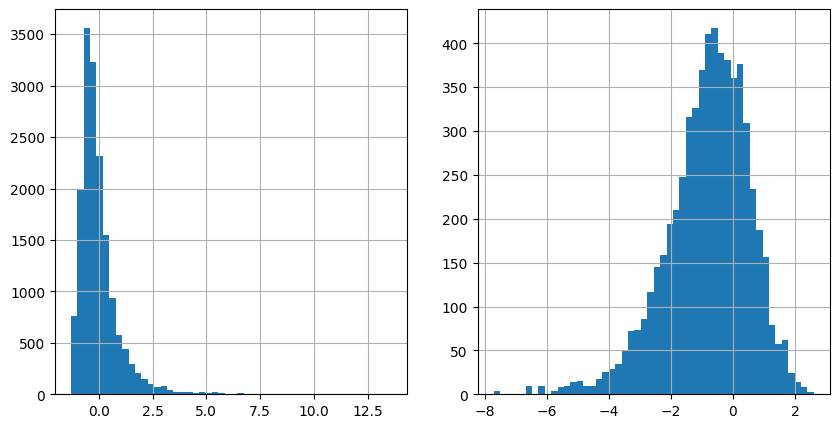

In [226]:
## Note that things look similar, but not identical, using the scaled data:
## We would generally transform first, then re-scale

fig, ax1 = plt.subplots(1,2, figsize=(10,5))

#Using our rescaled data:
X_train['population'].hist(ax=ax1[0], bins=50);

#With a log-transformation, it is nearly Gaussian
np.log(X_train['population']).hist(ax=ax1[1], bins=50);



## Custom Transformers and Pipelines

- We'll return to this later. First, let's train a model

# Part 3: Train the Model(s)

- We've got `X_train`, `X_test`, `y_train`, and `y_test` all ready to go!
- Let's train a couple simple models and examine their *in-sample* performance (won't look at the test data just yet)

In [227]:
#Start with good old linear regression:
#######

from sklearn.linear_model import LinearRegression

model = LinearRegression()

model.fit(X_train, y_train)

LinearRegression()

In [228]:
## Make some predictions: On the training data, still
y_pred = model.predict(X_train)

Text(0, 0.5, 'Predicted')

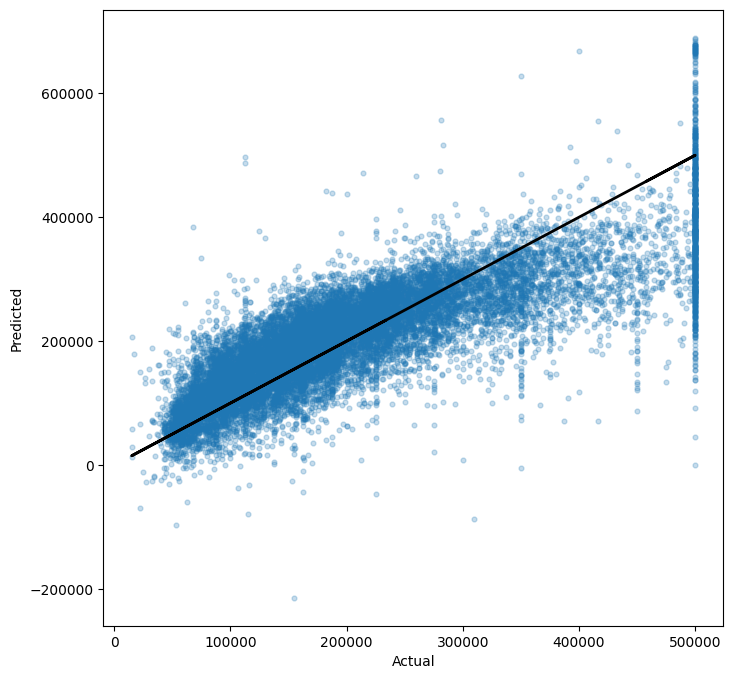

In [229]:
# Plot predictions against truth:

#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(8, 8))

#Scatter plot of prediction vs. actual
ax1.scatter(y_train, y_pred, s = 12, alpha=.25)

#Perfect prediction line
ax1.plot(y_train, y_train, linewidth=2, color='black')

ax1.set_xlabel('Actual')
ax1.set_ylabel('Predicted')

In [230]:
#Get R2 Score:
#######

model.score(X_train, y_train)

0.6505823416358203

In [231]:
#Can also get using:
########

from sklearn.metrics import r2_score

r2_score(y_train, y_pred)

0.6505823416358203

In [232]:
#Root Mean-Squared Error
from sklearn.metrics import mean_squared_error

mean_squared_error(y_train, y_pred, squared=False).round(2)

68161.87

In [233]:
#Mean Absolute Error
from sklearn.metrics import mean_absolute_error

mean_absolute_error(y_train, y_pred).round(2)

49592.44

In [234]:
#Compare to median housing value:
y_train.median()

179200.0

### How About K-Nearest Neighbors, Decision Tree, or Random Forest?

In [235]:
#Random Forest or Decision Tree
#######
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

#model = KNeighborsRegressor(n_neighbors=10)
#model = RandomForestRegressor(random_state=42)
model = DecisionTreeRegressor(random_state=42)

model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

Text(0, 0.5, 'Predicted')

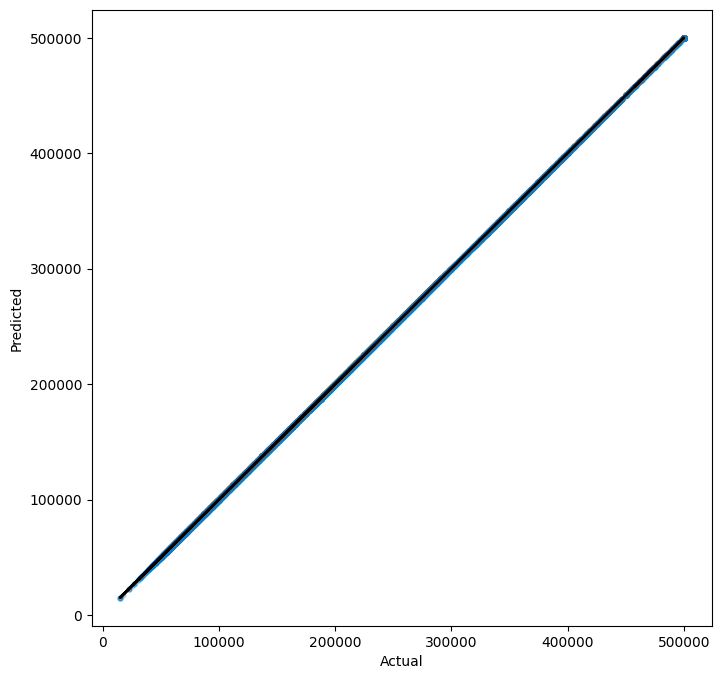

In [236]:

#Make predictions and Plot:
y_pred = model.predict(X_train)

#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(8, 8))

#Scatter plot of prediction vs. actual
ax1.scatter(y_train, y_pred, s = 12, alpha=.25)

#Perfect prediction line
ax1.plot(y_train, y_train, linewidth=2, color='black')

ax1.set_xlabel('Actual')
ax1.set_ylabel('Predicted')

In [237]:
#Performance on training data?
####

print(r2_score(y_train, y_pred))

print(mean_squared_error(y_train, y_pred, squared=False).round(2))

print(mean_absolute_error(y_train, y_pred).round(2))


1.0
0.0
0.0


### What gives?

- Linear Regression model did okay, but probably underfit compared to what we're capable of
- KNN can do almost arbitrarily well or poorly depending upon the number of neighbors: Either under or overfitting is occuring
- Decision Tree performed perfectly: This is almost certainly a severe case of overfitting
- The Random Forest did very well: Maybe we hit the sweet spot?

Let's use a **validation set** to compare models before we reveal the testing data.

Two basic options:

1. Use part of the testing data as a validation set: Can do in scikit-learn with just two iterations of the test-train-split methods we covered earlier
2. Use *k-fold cross-validation*:
    - Split the data into $k$ non-overlapping subsets
    - Train the model $k$ times: Use $k-1$ folds for training, and evaluate on the final fold
    - Yields $k$ evaulation scores. Can use the mean or whole distribution from there to compare models.

Note that in the limit you can set $k$ equal to the number of observations. That is, train the model using every observation but one. This is known as leave-one-out cross-validation (LOOCV). Sometimes if not otherwise qualified, "cross-validation" refers to this method.

#### Implementation?

It would not be too difficult, but rather tedious to implement this ourselves. We'd need:
1. Split the indices into folds: Account for the fact that, say, 99 observations does not divide evenly into 10 folds
2. Loop $k$ times. Grab the training data based on the fold indices, fit the model, and get the error metric(s)
3. Save everything as you go

Instead, we can use `cross_val_score` from scikit-learn:

Note: `cross_val_score` expects a utility function, not a cost function. That is, higher is better.

In [143]:
from sklearn.model_selection import cross_val_score

#Let's look at all of our models:
reg = LinearRegression()
knn = KNeighborsRegressor(n_neighbors=10)
tree = DecisionTreeRegressor(random_state=42)
forest = RandomForestRegressor(random_state=42)

#Get RMSEs; Note the negation:
reg_rmses = -cross_val_score(reg, X_train, y_train,
                              scoring="neg_root_mean_squared_error", cv=3)

knn_rmses = -cross_val_score(knn, X_train, y_train,
                              scoring="neg_root_mean_squared_error", cv=3)

tree_rmses = -cross_val_score(tree, X_train, y_train,
                              scoring="neg_root_mean_squared_error", cv=3)

#Forest takes a while...
forest_rmses = -cross_val_score(forest, X_train, y_train,
                              scoring="neg_root_mean_squared_error", cv=3)

In [144]:
#We got, for example:
tree_rmses

array([72180.61639994, 70522.11769098, 71680.97025123])

In [145]:
#Cast as a Series and describe:
#Linear Regression:
pd.Series(reg_rmses).describe()

count        3.000000
mean     69124.408745
std        359.320399
min      68709.722018
25%      69014.877496
50%      69320.032974
75%      69331.752108
max      69343.471243
dtype: float64

In [146]:
#Cast as a Series and describe:
#Linear Regression:
pd.Series(knn_rmses).describe()

count        3.000000
mean     62272.865165
std        992.553546
min      61215.774030
25%      61816.836489
50%      62417.898947
75%      62801.410733
max      63184.922518
dtype: float64

In [147]:
#Linear Regression:
pd.Series(tree_rmses).describe()

count        3.000000
mean     71461.234781
std        850.803884
min      70522.117691
25%      71101.543971
50%      71680.970251
75%      71930.793326
max      72180.616400
dtype: float64

In [148]:
#Linear Regression:
pd.Series(forest_rmses).describe()

count        3.000000
mean     50259.830566
std        652.612035
min      49521.508068
25%      50009.938411
50%      50498.368754
75%      50628.991816
max      50759.614878
dtype: float64

#### Conclusions?

Linear Regression and Decision Tree comparable, with Decision Tree overfitting. The KNN model actually does somewhat better. Random Forest is the best, but clearly some overfitting.

## Tune Hyperparameters

- Hyperparameters descibe the structure of your model
- They are not directly trained by the machine learning algorithm
- Can tune using validation/cross-validation
- Grid and Randomized searches are simple and available via scikit-learn
- Could also implement manually

### Let's tune a KNN Regressor: Tune the number of neighbors

- Let's just manually see what we get when varying the number of neighbors in a KNN regression

In [149]:
#Empty list to store RMSEs:
rmse_list = []
n_list = []

#Empty DataFrame, also to store results:
df = pd.DataFrame(columns=['RMSE', 'n'])


n_min = 1
n_max = 50

for n in range(n_min, n_max, 2):

    knn = KNeighborsRegressor(n_neighbors=n)

    #Get RMSEs;
    knn_rmses = -cross_val_score(knn, X_train, y_train,
                              scoring="neg_root_mean_squared_error", cv=10)

    #Append our lists:
    rmse_list.append(np.mean(knn_rmses))
    n_list.append(n)

    #Concat to the DataFrame too:
    df = pd.concat((df, pd.DataFrame({'RMSE':[np.mean(knn_rmses)], 'n':[n]})), ignore_index=True)

In [150]:
df.head()

,RMSE,n
0,76190.345600,1
1,64329.881647,3
2,62050.017686,5
3,61316.299927,7
4,61370.915964,9


In [151]:
#Minimum RMSE?
###########

df.loc[df.RMSE == df.RMSE.min()]

,RMSE,n
3,61316.299927,7


Text(0, 0.5, 'RMSE')

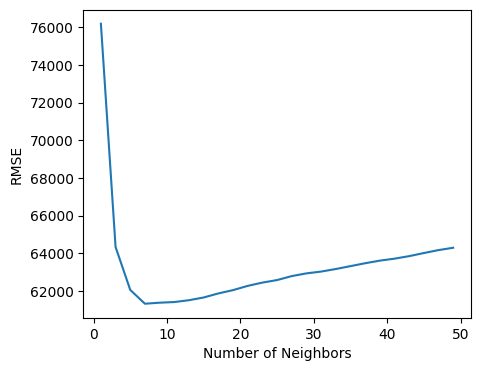

In [152]:
#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(5, 4))

ax1.plot(n_list, rmse_list)
ax1.set_xlabel('Number of Neighbors')
ax1.set_ylabel('RMSE')

### Use scikit-learn

- `GridSearchCV`
- `RandomizedSearchCV`

In [153]:
#Example of GridSearchCV:
###

from sklearn.model_selection import GridSearchCV

#Parameters dictionary:
parameters = {'n_neighbors': range(1, 50, 2)}

#Model
knn = KNeighborsRegressor(n_neighbors=n)

#Grid search
grid_search = GridSearchCV(knn, parameters, cv = 10)

#Fit 'er:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=KNeighborsRegressor(n_neighbors=49),
             param_grid={'n_neighbors': range(1, 50, 2)})

In [154]:
#Get the best parameters:
####

grid_search.best_params_

{'n_neighbors': 7}

In [155]:
#Example of RandomizedSearchCV:
###
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

#Parameters distribution:
param_dist = {'n_neighbors': randint(low=1, high=50)}

#Random search
rand_search = RandomizedSearchCV(knn, parameters, cv=10, n_iter=10)

#Fit 'er:
rand_search.fit(X_train, y_train)

RandomizedSearchCV(cv=10, estimator=KNeighborsRegressor(n_neighbors=49),
                   param_distributions={'n_neighbors': range(1, 50, 2)})

In [156]:
#And best param now?
####

rand_search.best_params_

{'n_neighbors': 9}

# Moment of Truth: Testing Data

- Let's test our random forest model on the testing data, at last


In [238]:
#Random Forest or Decision Tree
#######
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

Text(0, 0.5, 'Predicted')

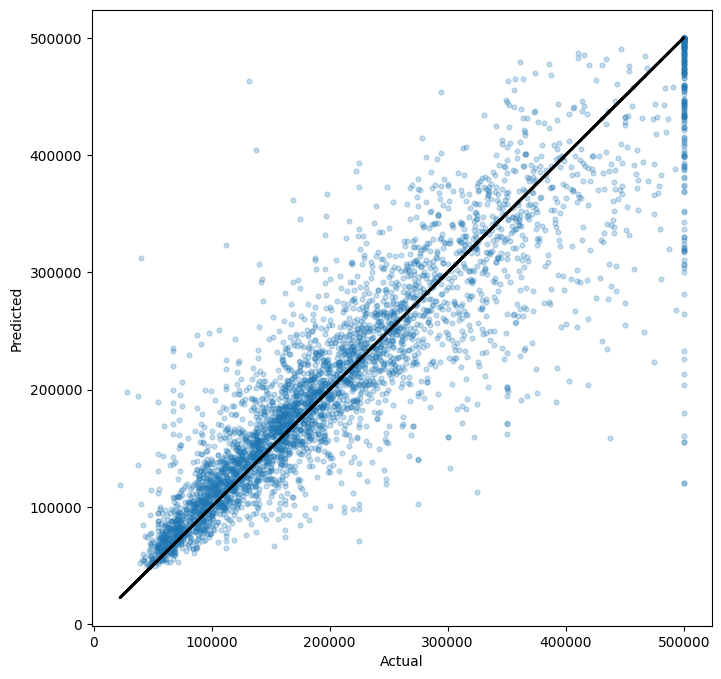

In [239]:
#And predict on test data:
#######

y_pred = model.predict(X_test)

#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(8, 8))

#Scatter plot of prediction vs. actual
ax1.scatter(y_test, y_pred, s = 12, alpha=.25)

#Perfect prediction line
ax1.plot(y_test, y_test, linewidth=2, color='black')

ax1.set_xlabel('Actual')
ax1.set_ylabel('Predicted')

In [240]:
#Performance on TESTING data?
####

print(r2_score(y_test, y_pred))

print(mean_squared_error(y_test, y_pred, squared=False).round(2))

print(mean_absolute_error(y_test, y_pred).round(2))


0.8172354399933658
49461.9
31686.86


#### Feature importance?

- Note that random forests give an estimate of feature importance

In [241]:
model.feature_importances_.round(3)

array([0.111, 0.104, 0.052, 0.025, 0.021, 0.031, 0.018, 0.484, 0.003,
       0.143, 0.   , 0.001, 0.007])

In [242]:
#Relate to features:
sorted(zip(model.feature_importances_.round(3), model.feature_names_in_), reverse=True)

[(0.484, 'median_income'),
 (0.143, 'ocean_proximity_INLAND'),
 (0.111, 'longitude'),
 (0.104, 'latitude'),
 (0.052, 'housing_median_age'),
 (0.031, 'population'),
 (0.025, 'total_rooms'),
 (0.021, 'total_bedrooms'),
 (0.018, 'households'),
 (0.007, 'ocean_proximity_NEAR OCEAN'),
 (0.003, 'ocean_proximity_<1H OCEAN'),
 (0.001, 'ocean_proximity_NEAR BAY'),
 (0.0, 'ocean_proximity_ISLAND')]